# Norification

TODO:     追加、修正が必要\
FIXME:    既知の不具合があり、修正が必要\
HACK:     リファクタリングが必要\
XXX:      なぜ動作するか分からない\
REVIEW:   意図通りの動作か見直す必要\
OPTIMIZE: 無駄が多く、ボトルネック\
CHANGED:  コードの変更履歴\
NOTE:     なぜそのコードになったかを付記\
WARNING:  注意

# Imports

In [14]:
# standard library
import glob
import math
import os
import pathlib
import random
import sys
import warnings

# third party
import matplotlib.pyplot as plt
import numpy as np
import polars as pl
import seaborn as sns
from scipy import stats
# from sklearn import preprocessing

# local
import formatting as fmt

# Initial settings

### warnings

In [15]:
# dfを表示する際の最大行/列数を指定します
# これによってdfが見やすくなります
# pl.options.display.max_rows = 10
# pl.options.display.max_columns = None

# 余計な警告表示をなくしてくれます
warnings.filterwarnings('ignore')

### Global variables

In [88]:
SUBJ = 1
GAME = 4
BLOCK = 4

SEQ_TYPES = ['slf', 'obs', 'test']
PAIR_PATS = ['30/40', '40/50', '50/30']
COND_PATS = ['ss', 'oo', 'so']
pat_label = ['S - O - T', 'O - S - T']

SLF_COLOR = ['darkslategray', 'mediumseagreen', 'lime']
OBS_COLOR = ['darkblue', 'cornflowerblue', 'cyan']
TEST_COLOR = ['maroon', 'orange', 'gold']
COLORS = [SLF_COLOR[1], OBS_COLOR[1], TEST_COLOR[1]]

SLF_TRIAL_NUM = 9
OBS_TRIAL_NUM = 9
TEST_TRIAL_NUM = 30

SLF_XLIM = SLF_TRIAL_NUM * BLOCK
OBS_XLIM = OBS_TRIAL_NUM * BLOCK
TEST_XLIM = TEST_TRIAL_NUM * BLOCK
ALL_XLIM = SLF_XLIM + OBS_XLIM + TEST_XLIM

IMG_TIME_YLIM = 5.0
CONF_TIME_YLIM = 3.0
CONF_YLIM = 1.0
ACC_YLIM = 1.0



SUBJ_COLS = ['block_num', 'trial_num', 'seq_type', 'seq_trial_num', 
            'condition', 'pair_pat', 'order_pat', 
            'mean_left', 'mean_right', 'sd', 
            'idx_left', 'idx_right',
            'pos_correct', 'mean_correct', 'idx_correct', 
            'pos_chosen', 'mean_chosen', 'idx_chosen',  
            'conf_pat', 'conf', 'acc', 'reward',
            'img_time', 'conf_time', 
            'img_pres_time', 'img_resp_time',
            'conf_pres_time', 'conf_resp_time',
            'reward_pres_time', 'reward_resp_time']
PARAM_COLS = ['subj', 'pat', 'alpha', 'beta', 'log_likelihood']

In [11]:

# loc_left_exp_key, loc_right_exp_key, img_correct_exp_key, pt_exp_key\
#     = 'loc_left_exp', 'loc_right_exp', 'img_correct_exp', 'pt_exp'

# 主にグラフのラベル用のリストです
num_list     = [1, 2, 3]
loc_list     = [30, 40, 50]
SEQ_TYPES1   = ['Self', 'Observation', 'Test']
SEQ_TYPES2   = ['Observation', 'Self', 'Test']
type_label   = ['slf', 'obs', 'test']
choice_label = ['S_choice', 'O_choice', 'T_choice']
conf_label   = ['S_conf', 'O_conf', 'T_conf']
block_label  = ['_1st', '_2nd', '_3rd']
S_SEQ_TYPES  = ['S' + i for i in block_label]
O_SEQ_TYPES  = ['O' + i for i in block_label]
T_SEQ_TYPES  = ['T' + i for i in block_label]



# Load Data 

In [18]:
# NOTE: 各データは以下の形式で格納されている
# individual[subj][game].slf/obs/test)
# integrated[game].slf/obs/test)
individual = fmt.generate_individual_data_instance()
integrated = fmt.generate_integrated_data_instance()

In [7]:
len(individual[1][1].slf)

36

In [8]:
len(individual)

2

In [86]:
integrated[2].slf

block_num,trial_num,seq_type,seq_trial_num,condition,pair_pat,order_pat,mean_left,mean_right,sd,idx_left,idx_right,pos_correct,mean_correct,idx_correct,pos_chosen,mean_chosen,idx_chosen,conf_pat,conf,acc,reward,img_time,conf_time,img_pres_time,img_resp_time,conf_pres_time,conf_resp_time,reward_pres_time,reward_resp_time,subj,group,conf_num
i64,i64,str,i64,i64,i64,i64,i64,i64,i64,i64,i64,str,i64,i64,str,i64,i64,i64,str,i64,i64,f64,f64,f64,f64,f64,f64,f64,f64,i32,i32,i32
1,10,"""slf""",1,0,2,2,50,40,10,2,1,"""left""",50,2,"""right""",40,1,1,"""low""",0,48,1.082,1.004,66.19,67.272,68.375,69.38,70.422,72.446,1,1,0
1,11,"""slf""",2,0,3,1,50,30,10,2,0,"""left""",50,2,"""right""",30,0,2,"""low""",0,20,1.272,1.181,72.99,74.262,75.274,76.456,77.514,79.539,1,1,0
1,12,"""slf""",3,0,1,1,30,40,10,0,1,"""right""",40,1,"""right""",40,1,2,"""low""",1,55,0.684,0.687,80.213,80.897,81.908,82.595,83.628,85.646,1,1,0
1,13,"""slf""",4,0,3,2,30,50,10,0,2,"""right""",50,2,"""right""",50,2,2,"""low""",1,63,1.188,0.466,86.187,87.375,88.408,88.874,89.913,91.929,1,1,0
1,14,"""slf""",5,0,1,2,40,30,10,1,0,"""left""",40,1,"""left""",40,1,1,"""high""",1,35,1.191,0.656,92.49,93.681,94.699,95.356,96.389,98.396,1,1,1
1,15,"""slf""",6,0,2,1,40,50,10,1,2,"""right""",50,2,"""right""",50,2,1,"""low""",1,48,0.876,0.656,98.936,99.812,100.84,101.496,102.549,104.557,1,1,0
1,16,"""slf""",7,0,3,1,50,30,10,2,0,"""left""",50,2,"""right""",30,0,1,"""low""",0,30,0.842,0.424,105.122,105.964,106.975,107.398,108.443,110.457,1,1,0
1,17,"""slf""",8,0,2,2,50,40,10,2,1,"""left""",50,2,"""left""",50,2,2,"""low""",1,53,0.782,0.515,111.013,111.795,112.808,113.322,114.374,116.389,1,1,0
1,18,"""slf""",9,0,1,1,30,40,10,0,1,"""right""",40,1,"""right""",40,1,2,"""high""",1,37,0.931,0.299,116.933,117.864,118.89,119.19,120.264,122.281,1,1,1


In [69]:
integrated[1].test.filter((pl.col('condition')==1) & (pl.col('pair_pat')==2))
# integrated[1].test.filter((pl.col('condition')==1))

block_num,trial_num,seq_type,seq_trial_num,condition,pair_pat,order_pat,mean_left,mean_right,sd,idx_left,idx_right,pos_correct,mean_correct,idx_correct,pos_chosen,mean_chosen,idx_chosen,conf_pat,conf,acc,reward,img_time,conf_time,img_pres_time,img_resp_time,conf_pres_time,conf_resp_time,reward_pres_time,reward_resp_time,subj,group,conf_num
i64,i64,str,i64,i64,i64,i64,i64,i64,i64,i64,i64,str,i64,i64,str,i64,i64,i64,str,i64,i64,f64,f64,f64,f64,f64,f64,f64,f64,i32,i32,i32
1,25,"""test""",7,1,2,2,50,40,10,2,1,"""left""",50,2,"""left""",50,2,2,"""high""",1,0,1.061,0.623,177.766,178.826,179.855,180.477,181.614,183.627,1,1,1
1,40,"""test""",22,1,2,1,40,50,10,1,2,"""right""",50,2,"""right""",50,2,2,"""high""",1,0,0.783,0.498,288.52,289.303,290.32,290.818,291.955,293.969,1,1,1
2,73,"""test""",37,1,2,1,40,50,10,1,2,"""right""",50,2,"""right""",50,2,1,"""high""",1,0,1.984,0.723,552.221,554.205,555.237,555.96,557.24,559.251,1,1,1
2,88,"""test""",52,1,2,2,50,40,10,2,1,"""left""",50,2,"""left""",50,2,1,"""high""",1,0,0.855,1.123,667.062,667.917,668.934,670.057,671.351,673.356,1,1,1
3,121,"""test""",67,1,2,1,40,50,10,1,2,"""right""",50,2,"""right""",50,2,1,"""high""",1,0,0.8,0.615,935.04,935.84,936.851,937.465,938.841,940.839,1,1,1
3,136,"""test""",82,1,2,2,50,40,10,2,1,"""left""",50,2,"""left""",50,2,2,"""high""",1,0,2.622,0.525,1062.826,1065.448,1066.473,1066.998,1068.321,1070.32,1,1,1
4,169,"""test""",97,1,2,2,50,40,10,2,1,"""left""",50,2,"""left""",50,2,1,"""high""",1,0,0.616,0.575,1337.016,1337.632,1338.639,1339.214,1340.836,1342.848,1,1,1
4,184,"""test""",112,1,2,1,40,50,10,1,2,"""right""",50,2,"""right""",50,2,2,"""high""",1,0,0.607,1.416,1442.197,1442.804,1443.815,1445.231,1446.767,1448.771,1,1,1


In [13]:
integrated[1].slf.select(pl.col('conf_num')==1)

conf_num
bool
false
false
true
false
false
true
false
true
true


In [ ]:
df_time = integrated[1].slf
df_time.filter(pl.col('block')==3).sort('t_conf')
# df_time

game_No,seq_No,block,seq_pattern,loc_pattern,loc_left,loc_right,sd,pt,conf,reward,t_choice,t_conf,idx_left,idx_right,img_choice,img_correct,loc_choice,t_choice_pres,t_choice_resp,t_conf_pres,t_conf_resp,t_reward_pres,t_reward_resp,subj_No,type,group,idx_choice
i64,i64,i64,i64,i64,i64,i64,i64,i64,i64,f64,f64,f64,i64,i64,i64,i64,i64,f64,f64,f64,f64,f64,f64,i32,str,i32,i32
112,28,3,0,1,30,40,10,1,3,32.40497,1.15,0.018,1,2,2,2,40,839.126,840.276,841.287,841.306,842.491,844.493,4,"""slf""",2,2
115,31,3,0,1,40,30,10,1,2,55.582684,0.812,0.019,2,1,1,1,40,754.046,754.858,755.873,755.892,757.133,759.129,10,"""slf""",2,2
114,30,3,0,2,40,50,10,1,3,67.515598,0.911,0.022,2,3,2,2,50,727.291,728.203,729.208,729.229,730.42,732.419,11,"""slf""",1,3
110,26,3,0,3,30,50,10,1,2,65.874483,0.672,0.033,1,3,2,2,50,785.24,785.912,786.923,786.956,788.246,790.245,12,"""slf""",2,3
113,29,3,0,3,50,30,10,1,3,45.376159,0.71,0.033,3,1,1,1,50,802.846,803.556,804.573,804.606,805.85,807.856,12,"""slf""",2,3
119,35,3,0,3,50,30,10,1,3,57.952821,0.731,0.05,3,1,1,1,50,853.736,854.467,855.478,855.528,856.72,858.717,3,"""slf""",1,3
114,30,3,0,2,40,50,10,1,2,67.515598,0.527,0.074,2,3,2,2,50,748.662,749.19,750.207,750.281,751.468,753.473,10,"""slf""",2,3
120,36,3,0,2,40,50,10,1,3,55.906812,0.876,0.076,2,3,2,2,50,783.753,784.629,785.63,785.706,786.878,788.879,10,"""slf""",2,3
116,32,3,0,3,30,50,10,1,3,32.52065,0.537,0.083,1,3,2,2,50,821.009,821.546,822.575,822.658,824.018,826.023,12,"""slf""",2,3


In [ ]:
df_time = integrated[1].slf
df_1 = df_time.filter(pl.col('block') == 1)
df_time.select(pl.col('block', 'loc_pattern', 't_choice', 't_conf').mean().over('block', 'loc_pattern')).unique().sort('block', 'loc_pattern')

block,loc_pattern,t_choice,t_conf
f64,f64,f64,f64
1.0,1.0,1.36655,0.550183
1.0,2.0,1.269817,0.604967
1.0,3.0,1.152933,0.481667
2.0,1.0,1.2418,0.47625
2.0,2.0,1.2353,0.511817
2.0,3.0,1.031383,0.6079
3.0,1.0,1.060283,0.451467
3.0,2.0,1.02165,0.423233
3.0,3.0,0.82575,0.372117


In [ ]:
df_time.select(pl.col('block', 'loc_pattern', 't_choice', 't_conf').min().over('block', 'loc_pattern')).unique().sort('block', 'loc_pattern')

block,loc_pattern,t_choice,t_conf
i64,i64,f64,f64
1,1,0.431,0.027
1,2,0.356,0.065
1,3,0.421,0.033
2,1,0.512,0.019
2,2,0.463,0.042
2,3,0.367,0.033
3,1,0.072,0.018
3,2,0.409,0.022
3,3,0.404,0.033


In [ ]:
df_time.select(pl.col('block', 'loc_pattern', 't_choice', 't_conf').max().over('block', 'loc_pattern')).unique().sort('block', 'loc_pattern')

block,loc_pattern,t_choice,t_conf
i64,i64,f64,f64
1,1,2.856,1.233
1,2,2.689,1.289
1,3,3.121,1.456
2,1,3.42,1.806
2,2,3.033,1.34
2,3,3.164,1.866
3,1,3.02,1.616
3,2,2.818,1.679
3,3,2.476,1.117


# Playground

In [ ]:
df_preferred1 = integrated[1].test.filter(pl.col('loc_pattern')>=4)
df_preferred1 = df_preferred1.with_columns(pl.when(pl.col('img_choice')==0).then(df_preferred1['idx_left'])
                                        .otherwise(df_preferred1['idx_right']).alias('preferred'))

df_preferred1 = df_preferred1.get_column('preferred').value_counts().sort('preferred')
# display(df_preferred1)
display(df_preferred1.with_columns((pl.col('counts') / 90).alias('preferred rate')))

df_preferred2 = integrated[2].test.filter(pl.col('loc_pattern')>=4)
df_choice_choice_choice_choice_choice_preferred2 = df_preferred2.with_columns(pl.when(pl.col('img_choice')==0).then(df_preferred2['idx_left'])
                                        .otherwise(df_preferred2['idx_right']).alias('preferred'))

df_preferred2 = df_preferred2.get_column('preferred').value_counts().sort('preferred')
display(df_preferred2.with_columns((pl.col('counts') / 90).alias('preferred rate')))


preferred,counts,preferred rate
i64,u32,f64
1,25,0.277778
2,60,0.666667
3,54,0.6
4,65,0.722222
5,30,0.333333
6,36,0.4


ColumnNotFoundError: preferred

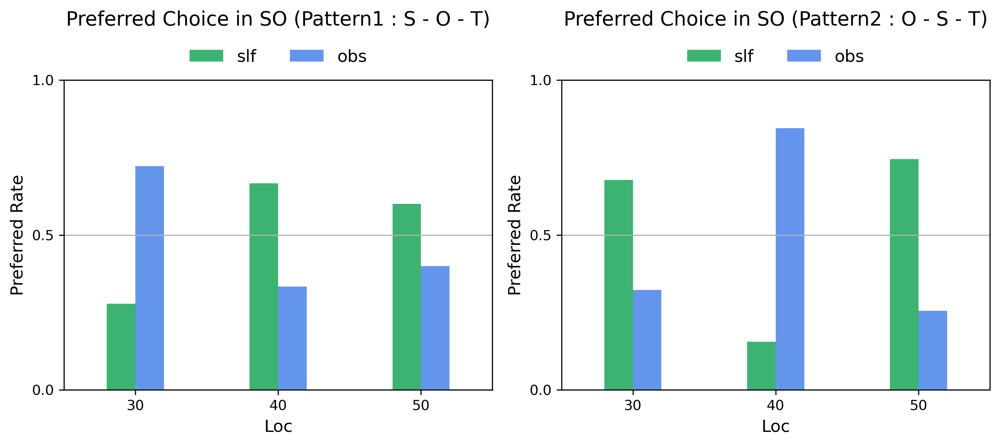

In [ ]:
def prefer_each_pair(ax, df, seq, gap, width, color, xlim, ylim):
    df = df.filter(pl.col('loc_pattern')>=4)
    df = df.with_columns(pl.when(pl.col('img_choice')==0).then(df['idx_left'])
                                        .otherwise(df['idx_right']).alias('preferred'))
    df = df.get_column('preferred').value_counts().sort('preferred')
    df = df.with_columns((pl.col('counts') / 90).alias('preferred rate'))
    
    df_s = df.filter(pl.col('preferred') <= 3).with_columns(pl.when(pl.col('preferred')==1).then(30)
                                                            .when(pl.col('preferred')==2).then(40)
                                                            .otherwise(50).alias('loc_preferred'))
    df_o = df.filter(pl.col('preferred') >= 4).with_columns(pl.when(pl.col('preferred')==4).then(30)
                                                            .when(pl.col('preferred')==5).then(40)
                                                            .otherwise(50).alias('loc_preferred'))

    for i, df_ in enumerate([df_s, df_o]):
        ax.bar(df_.get_column('loc_preferred')+gap[i],
                df_.get_column('preferred rate'),
                label=seq[i],
                width=width,
                color=color[i],
                # marker='o'
                )
    ax.set_xlim(25, 55)
    ax.set_ylim(0, ylim)
    ax.set_xticks(np.arange(30, 60, step=10))
    ax.set_yticks(np.arange(0, ylim+.1, .5))
    ax.set_xlabel('Loc', fontsize=12)
    ax.set_ylabel('Preferred Rate', fontsize=12)

    ax.grid(axis='y')
    ax.legend(loc='lower center', bbox_to_anchor=(.5,1), ncol=3, frameon=False, fontsize=12)


gap = [-1, 1]
width = 2

xlim_t = 3
ylim = 1

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4.5), dpi=300, tight_layout=True, sharey=False)
for pat in range(1, 3):    
    prefer_each_pair(ax[pat-1], integrated[pat].test, SEQ_TYPES, gap, width, colors, xlim_t, ylim)
    
    ax[pat-1].set_title(f'Preferred Choice in SO (Pattern{pat} : {pat_label[pat-1]})', y=1.15, fontsize=14)

In [ ]:
df = integrated[1].test.filter(pl.col('loc_pattern')==4)
df_choice = df.with_columns(pl.when(pl.col('img_choice')==0).then(df['idx_left'])
                            .otherwise(df['idx_right']).alias('preferred'))
# display(df_choice)
df_choice = df_choice.select('block', 'preferred').groupby('block', 'preferred').count().sort('block', 'preferred')
df_choice = df_choice.with_columns((pl.col('count') / 30).alias('preferred rate'))
display(df_choice)

In [ ]:
def prefer_each_block(ax, df, loc, seq, pair, gap, width, color, xlim, ylim):
    # df_block = [df.filter(pl.col('block')==1),
    #             df.filter(pl.col('block')==2),
    #             df.filter(pl.col('block')==3)]
    # df_s = []
    # df_o = []
    
    # for df_ in df_block:
    #     df_ = df_.filter(pl.col('loc_pattern')>=4)
    #     df_ = df_.with_columns(pl.when(pl.col('img_choice')==0).then(df_['idx_left'])
    #                                     .otherwise(df_['idx_right']).alias('preferred'))
    #     df_ = df_.get_column('preferred').value_counts().sort('preferred')

    #     df_ = df_.with_columns((pl.col('counts') / 30).alias('preferred rate'))
    
    #     df_s.append(df_.filter(pl.col('preferred') <= 3).with_columns(pl.when(pl.col('preferred')==1).then(30)
    #                                                     .when(pl.col('preferred')==2).then(40)
    #                                                     .otherwise(50).alias('loc_preferred')))
    #     df_o.append(df_.filter(pl.col('preferred') >= 4).with_columns(pl.when(pl.col('preferred')==4).then(30)
    #                                                         .when(pl.col('preferred')==5).then(40)
    #                                                         .otherwise(50).alias('loc_preferred')))
    df = df.with_columns(pl.when(pl.col('img_choice')==0).then(df['idx_left'])
                                .otherwise(df['idx_right']).alias('preferred'))
    df_choice = df.select('block', 'preferred').groupby('block', 'preferred').count().sort('block', 'preferred')
    df_choice = df_choice.with_columns((pl.col('count') / 30).alias('preferred rate'))
    
    df_choice_s = df_choice.filter(pl.col('preferred') == loc)
    df_choice_o = df_choice.filter(pl.col('preferred') == loc+3)

    for i, df_ in enumerate([df_choice_s, df_choice_o]):
        ax.bar(df_.get_column('block')+gap[i],
                df_.get_column('preferred rate'),
                label=seq[i],
                width=width,
                color=color[i],
                # marker='o'
                )

    ax2 = ax.twinx()
    # df_conf = df.with_columns(pl.when(pl.col('preferred')%3==1).then(30)
    #                                 .when(pl.col('preferred')%3==2).then(40)
    #                                 .otherwise(50).alias('loc_preferred'))
    # df_conf_o = df_conf.filter(pl.col('preferred') >= 4).with_columns(pl.when(pl.col('preferred')==4).then(30)
    #                                                         .when(pl.col('preferred')==5).then(40)
    #                                                         .otherwise(50).alias('loc_preferred'))
    df_conf = df.select('block', 'conf').groupby('block').mean().sort('block')

    ax2.scatter(df_conf.get_column('block'),
            df_conf.get_column('conf'),
            label='conf_avg',
            # width=width,
            color='k',
            # marker='o'
            )
    
    ax.set_xlim(0, -~xlim)
    ax.set_ylim(0, ylim)
    ax.set_xticks(np.arange(0, -~xlim, step=1))
    ax.set_yticks(np.arange(0, ylim+.1, .5))
    ax.set_xlabel('Block #', fontsize=12)
    ax.set_ylabel('Preferred Rate', fontsize=12)
    ax.grid(axis='y')
    ax.legend(loc='lower center', bbox_to_anchor=(.5,1.08), ncol=3, frameon=False, fontsize=12)
    ax.set_title(pair[loc-1], y=1.2, fontsize=14)

    ax2.set_ylim(0, ylim)
    ax2.set_yticks(np.arange(0, 3.1, .5))
    ax2.set_ylabel('Confidence', fontsize=12)
    ax2.grid(axis='y')
    ax2.legend(loc='lower center', bbox_to_anchor=(.5,1), ncol=3, frameon=False, fontsize=12)


gap = [-.15, .15]
width = .3

xlim_t = 3
ylim = 1
pair_label2 = ['30/30', '40/40', '50/50']

for pat in range(1, 3):    
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4.5), dpi=300, tight_layout=True, sharey=False)
    prefer_each_block(ax[0], integrated[pat].test.filter(pl.col('loc_pattern')==4), 1, SEQ_TYPES, pair_label2, gap, width, colors, xlim_t, ylim)
    prefer_each_block(ax[1], integrated[pat].test.filter(pl.col('loc_pattern')==5), 2, SEQ_TYPES, pair_label2, gap, width, COLORS, xlim_t, ylim)
    prefer_each_block(ax[2], integrated[pat].test.filter(pl.col('loc_pattern')==6), 3, SEQ_TYPES, pair_label2, gap, width, COLORS, xlim_t, ylim)
    2
    plt.suptitle(f'Preferred Choice in SO (Pattern{pat} : {pat_label[pat-1]})', fontsize=14)

# Reaction Time

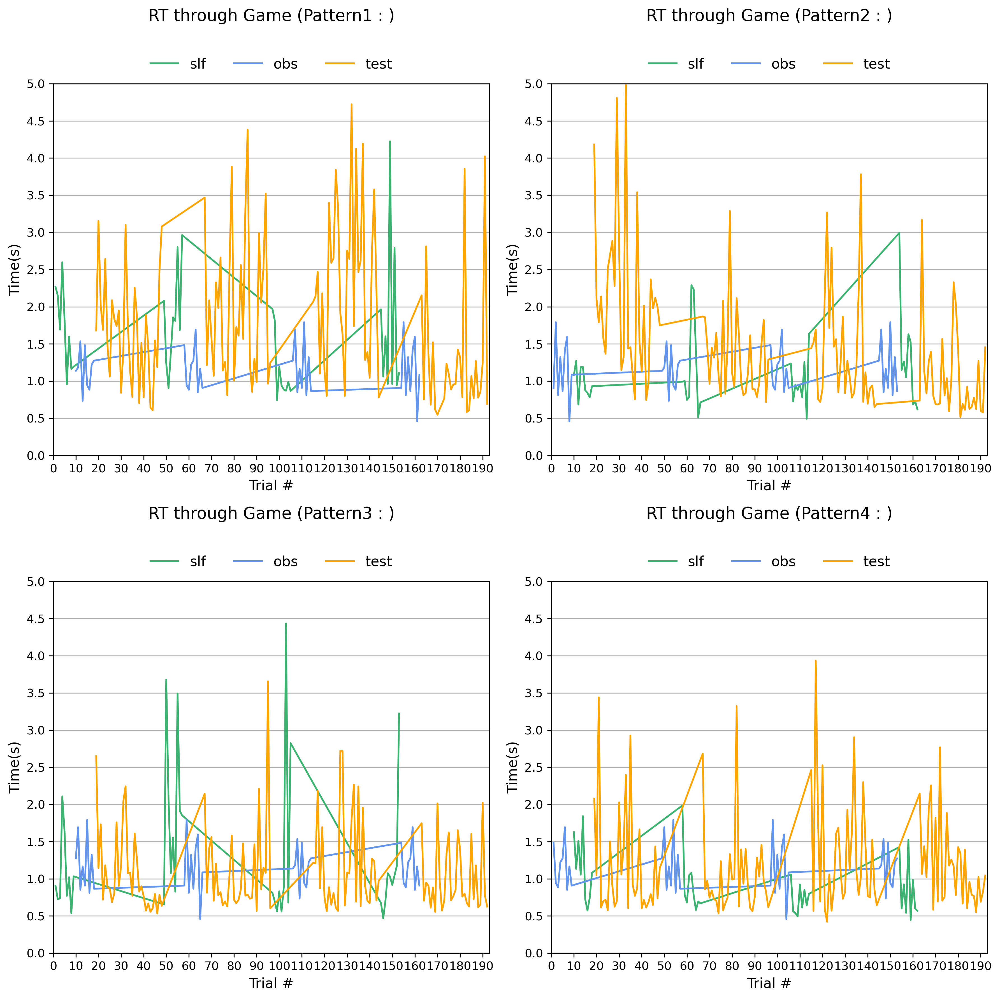

In [92]:
def rt_through_game(ax, df, seq, color, game_pat, xlim, ylim):
    df = df.select(pl.col('trial_num', 'img_time')).groupby('trial_num').mean().sort(by='trial_num')
    
    ax.plot(df.get_column('trial_num'),
            df.get_column('img_time'),
            label=seq,
            # width=.5,
            color=color,
            )
    ax.set_xlim(0, xlim+1)
    ax.set_ylim(0, ylim)
    ax.set_xticks(np.arange(0, xlim+1, step=10))
    ax.set_yticks(np.arange(0, ylim+.1, .5))
    ax.set_xlabel('Trial #', fontsize=12)
    ax.set_ylabel('Time(s)', fontsize=12)

    ax.set_title(f'RT through Game (Pattern{game_pat} : )', y=1.15, fontsize=14)
    ax.grid(axis='y')
    ax.legend(loc='lower center', bbox_to_anchor=(.5,1), ncol=3, frameon=False, fontsize=12)

fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(12, 12), dpi=300, tight_layout=True, sharey=False)

for game_pat in range(GAME):
    rt_through_game(ax[game_pat//2][game_pat%2], integrated[game_pat+1].slf, 
                    SEQ_TYPES[0], COLORS[0], game_pat+1, ALL_XLIM, IMG_TIME_YLIM)
    rt_through_game(ax[game_pat//2][game_pat%2], integrated[game_pat+1].obs, 
                    SEQ_TYPES[1], COLORS[1], game_pat+1, ALL_XLIM, IMG_TIME_YLIM)
    rt_through_game(ax[game_pat//2][game_pat%2], integrated[game_pat+1].test, 
                    SEQ_TYPES[2], COLORS[2], game_pat+1, ALL_XLIM, IMG_TIME_YLIM)


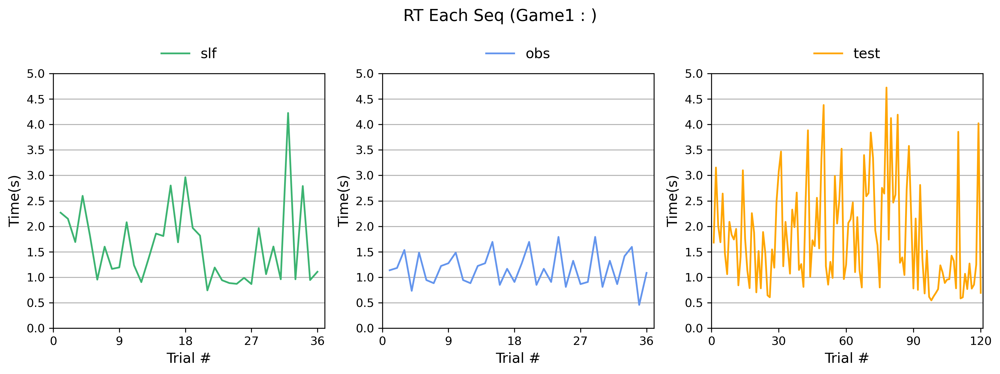

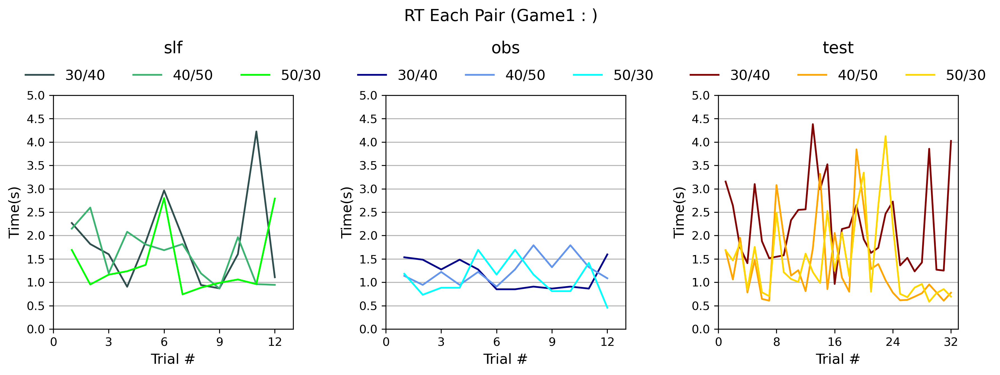

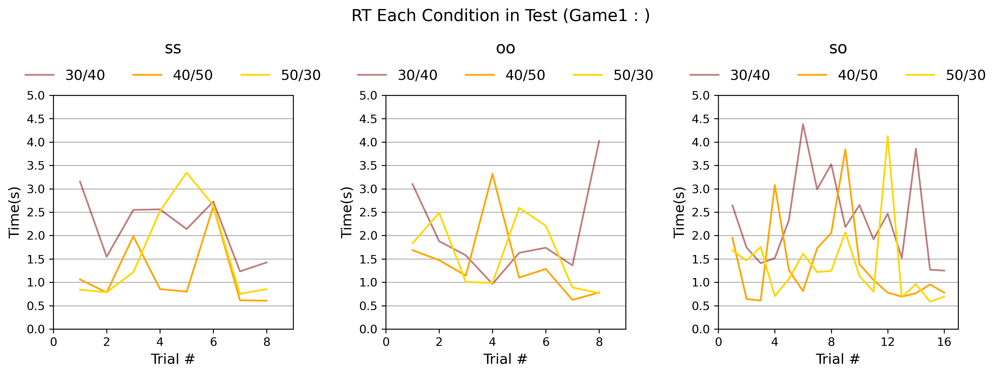

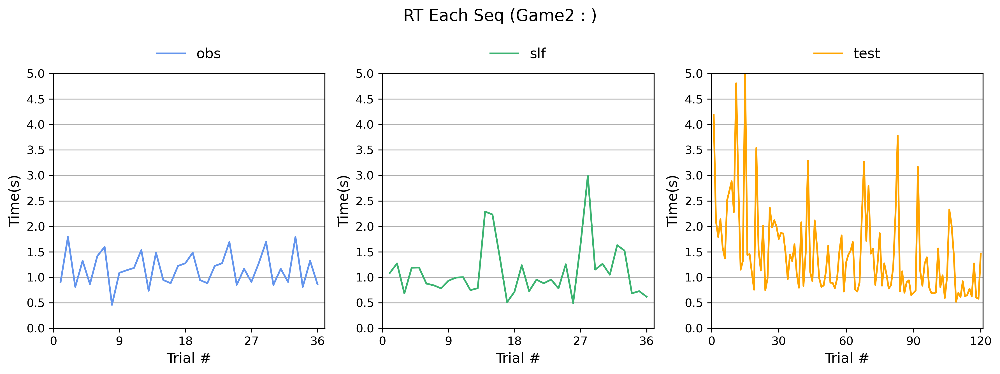

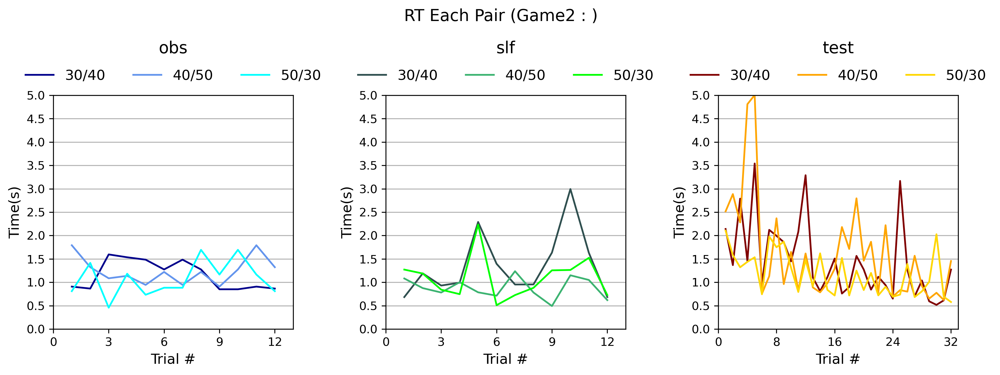

...

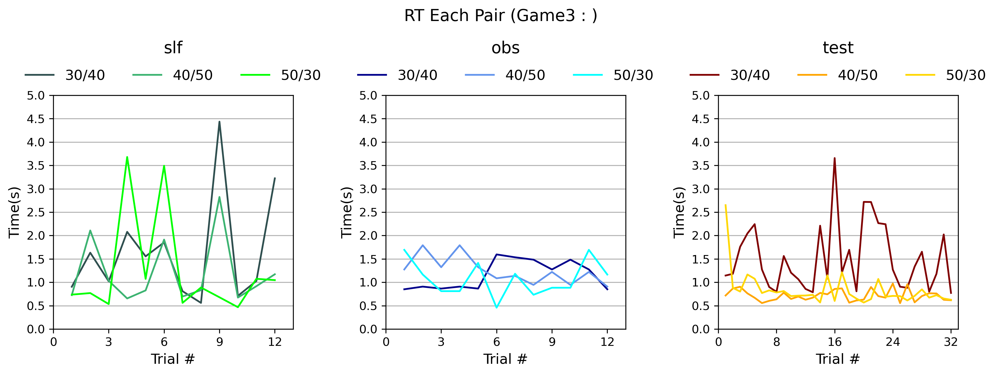

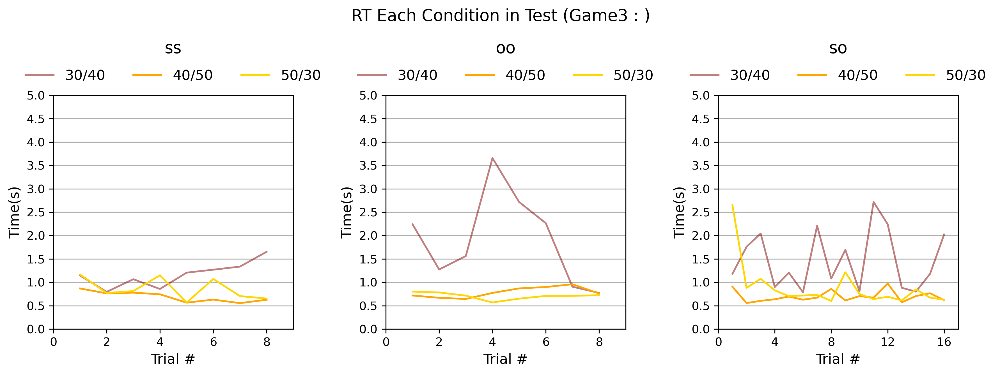

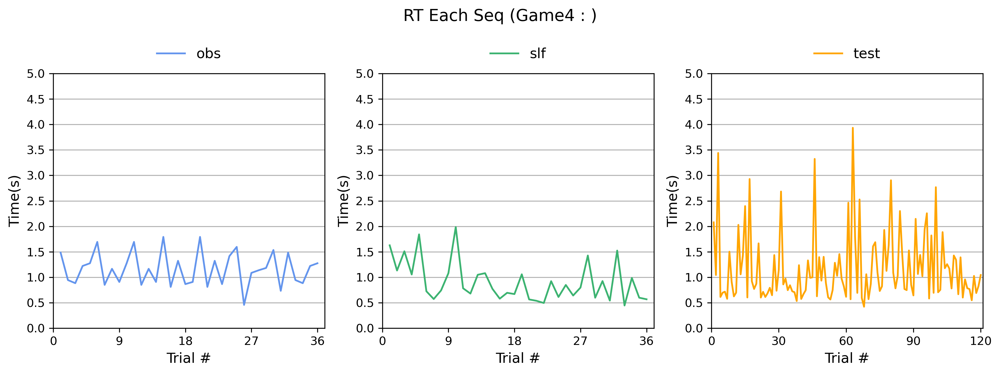

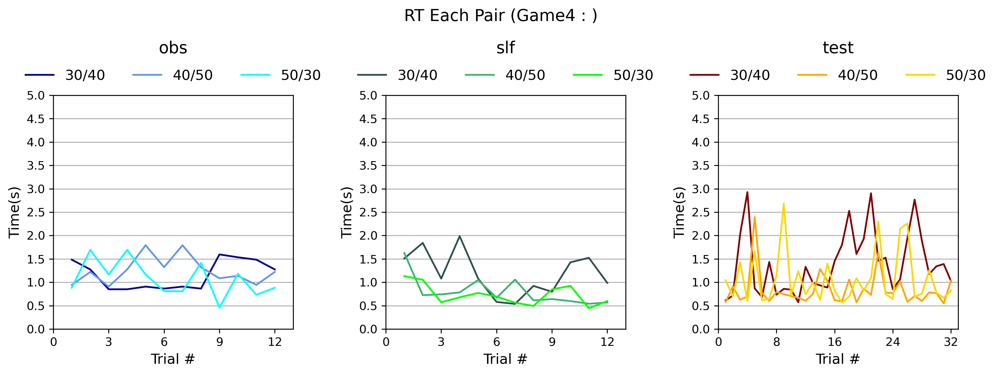

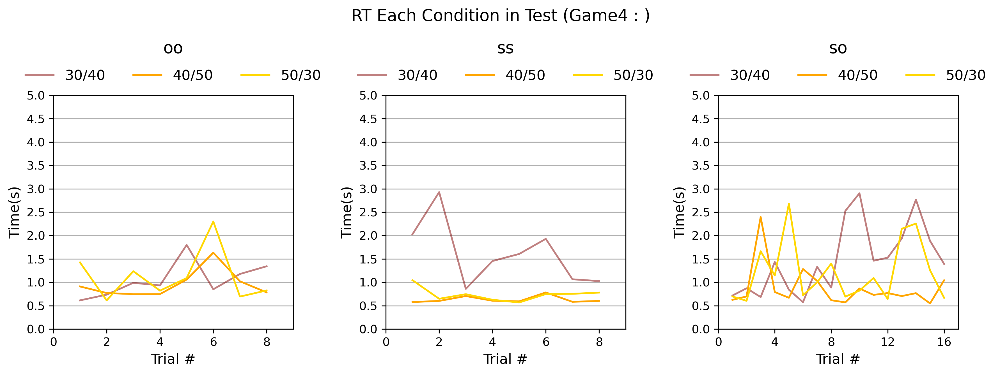

In [100]:
def rt_each_seq(ax, df, seq, color, xlim, ylim):
    df = df.select(pl.col('seq_trial_num', 'img_time')).groupby('seq_trial_num').mean().sort(by='seq_trial_num')
    
    ax.plot(df.get_column('seq_trial_num'),
            df.get_column('img_time'),
            label=seq,
            # width=.5,
            color=color
            )
    
    ax.set_xlim(0, -~xlim)
    ax.set_ylim(0, ylim)
    ax.set_xticks(np.arange(0, -~xlim, step=xlim//4))
    ax.set_yticks(np.arange(0, ylim+.1, .5))
    ax.set_xlabel('Trial #', fontsize=12)
    ax.set_ylabel('Time(s)', fontsize=12)

    # ax.set_title(seq, y=1.15, fontsize=14)
    ax.grid(axis='y')
    ax.legend(loc='lower center', bbox_to_anchor=(.5,1), ncol=3, frameon=False, fontsize=12)


def rt_each_pair(ax, df, seq, pair, color, xlim, ylim):
    df = df.select(pl.col('seq_trial_num', 'pair_pat', 'img_time')).groupby('seq_trial_num', 'pair_pat')\
        .mean().sort(by='seq_trial_num')
        
    df1 = df.filter(pl.col('pair_pat')==1).with_row_count().with_columns(pl.col('row_nr') + 1)
    df2 = df.filter(pl.col('pair_pat')==2).with_row_count().with_columns(pl.col('row_nr') + 1)
    df3 = df.filter(pl.col('pair_pat')==3).with_row_count().with_columns(pl.col('row_nr') + 1)
    
    for i, df_ in enumerate([df1, df2, df3]):
        ax.plot(df_.get_column('row_nr'),
                df_.get_column('img_time'),
                label=pair[i],
                # width=.5,
                color=color[i]
                )
    
    ax.set_xlim(0, xlim+1)
    ax.set_ylim(0, ylim)
    ax.set_xticks(np.arange(0, xlim+.1, step=xlim//4))
    ax.set_yticks(np.arange(0, ylim+.1, .5))
    ax.set_xlabel('Trial #', fontsize=12)
    ax.set_ylabel('Time(s)', fontsize=12)

    ax.set_title(seq, y=1.15, fontsize=14)
    ax.grid(axis='y')
    ax.legend(loc='lower center', bbox_to_anchor=(.5,1), ncol=3, frameon=False, fontsize=12)


def rt_each_cond(ax, df, cond, pair, width, color, alpha, xlim, ylim):
    df = df.select(pl.col('seq_trial_num', 'pair_pat', 'img_time')).groupby('seq_trial_num', 'pair_pat')\
        .mean().sort(by='seq_trial_num')

    df1 = df.filter(pl.col('pair_pat')==1).with_row_count().with_columns(pl.col('row_nr') + 1)
    df2 = df.filter(pl.col('pair_pat')==2).with_row_count().with_columns(pl.col('row_nr') + 1)
    df3 = df.filter(pl.col('pair_pat')==3).with_row_count().with_columns(pl.col('row_nr') + 1)

    for i, df_ in enumerate([df1, df2, df3]):
        ax.plot(df_.get_column('row_nr'),
                df_.get_column('img_time'),
                label=pair[i],
                # width=width,
                color=color[i],
                alpha=alpha[i]
                )

    ax.set_xlim(0, -~xlim)
    ax.set_ylim(0, ylim)
    ax.set_xticks(np.arange(0, -~xlim, step=xlim//4))
    ax.set_yticks(np.arange(0, ylim+.1, .5))
    ax.set_xlabel('Trial #', fontsize=12)
    ax.set_ylabel('Time(s)', fontsize=12)

    ax.set_title(cond, y=1.15, fontsize=14)
    ax.grid(axis='y')
    ax.legend(loc='lower center', bbox_to_anchor=(.5,1), ncol=3, frameon=False, fontsize=12)

xlim_so = 36
xlim_t = 90
ylim = 2.5
alpha = [.5, 1, 1]

for game_pat in range(GAME):
    s, o = (0, 1) if game_pat%2==0 else (1, 0)
    
    # Each Sequence
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4.5), dpi=300, tight_layout=True, sharey=False)
    rt_each_seq(ax[s], integrated[game_pat+1].slf, SEQ_TYPES[0], COLORS[0], SLF_XLIM, IMG_TIME_YLIM)
    rt_each_seq(ax[o], integrated[game_pat+1].obs, SEQ_TYPES[1], COLORS[1], OBS_XLIM, IMG_TIME_YLIM)
    rt_each_seq(ax[2], integrated[game_pat+1].test, SEQ_TYPES[2], COLORS[2], TEST_XLIM, IMG_TIME_YLIM)
    plt.suptitle(f'RT Each Seq (Game{game_pat+1} : )', fontsize=14)
    
    # Each Pair
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4.5), dpi=300, tight_layout=True, sharey=False)
    rt_each_pair(ax[s], integrated[game_pat+1].slf, SEQ_TYPES[0], PAIR_PATS, SLF_COLOR, SLF_XLIM//3, IMG_TIME_YLIM)
    rt_each_pair(ax[o], integrated[game_pat+1].obs, SEQ_TYPES[1], PAIR_PATS, OBS_COLOR, OBS_XLIM//3, IMG_TIME_YLIM)
    rt_each_pair(ax[2], integrated[game_pat+1].test, SEQ_TYPES[2], PAIR_PATS, TEST_COLOR, 32, IMG_TIME_YLIM)
    plt.suptitle(f'RT Each Pair (Game{game_pat+1} : )', fontsize=14)
    
    # Each Condition in Test
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4.5), dpi=300, tight_layout=True, sharey=False)
    rt_each_cond(ax[s], integrated[game_pat+1].test.filter(pl.col('condition')==1),
                    COND_PATS[0], PAIR_PATS, width, TEST_COLOR, alpha, 8, IMG_TIME_YLIM)
    rt_each_cond(ax[o], integrated[game_pat+1].test.filter(pl.col('condition')==2),
                    COND_PATS[1], PAIR_PATS, width, TEST_COLOR, alpha, 8, IMG_TIME_YLIM)
    rt_each_cond(ax[2], integrated[game_pat+1].test.filter(pl.col('condition')>=3),
                    COND_PATS[2], PAIR_PATS, width, TEST_COLOR, alpha, 16, IMG_TIME_YLIM)
    plt.suptitle(f'RT Each Condition in Test (Game{game_pat+1} : )', fontsize=14)

# Confidence

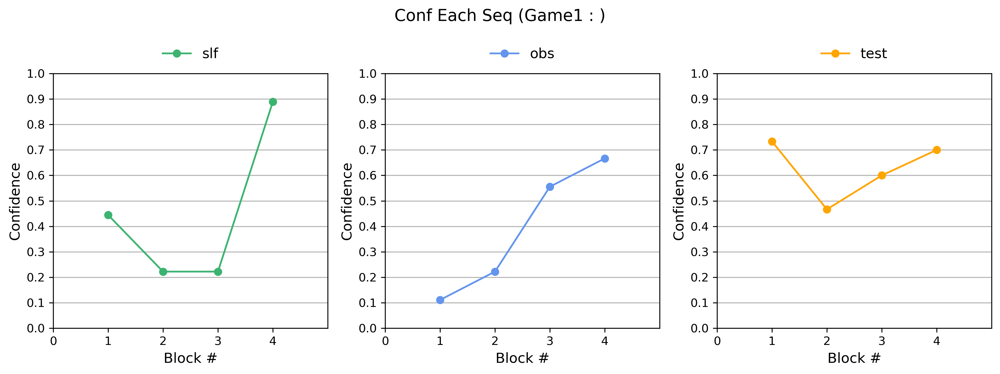

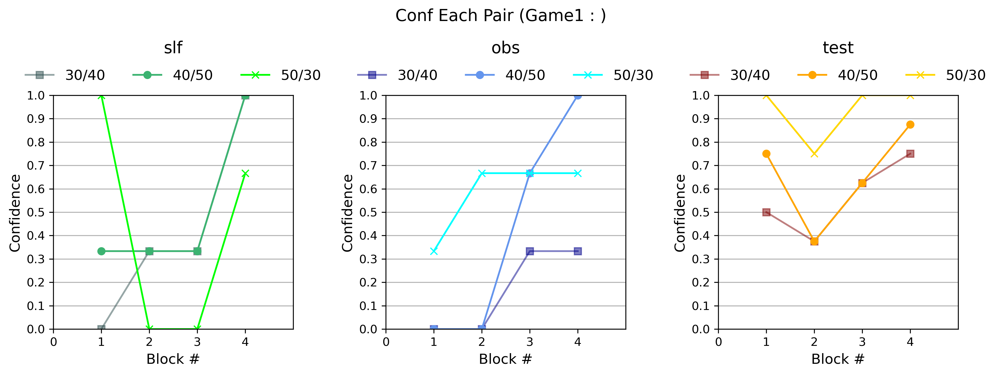

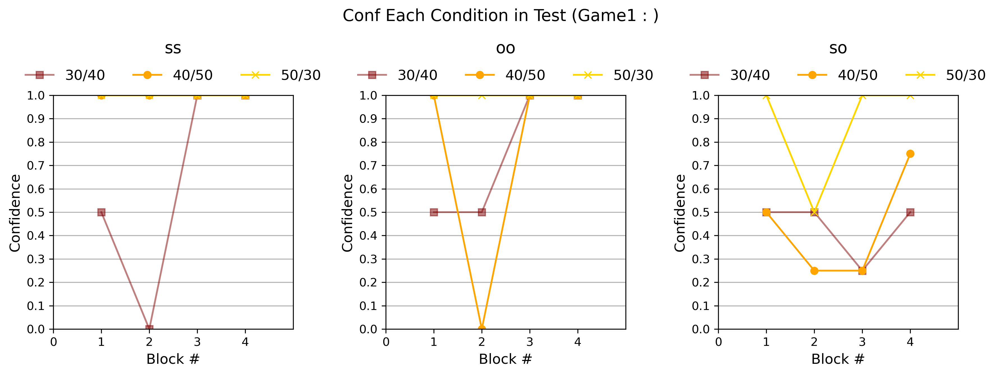

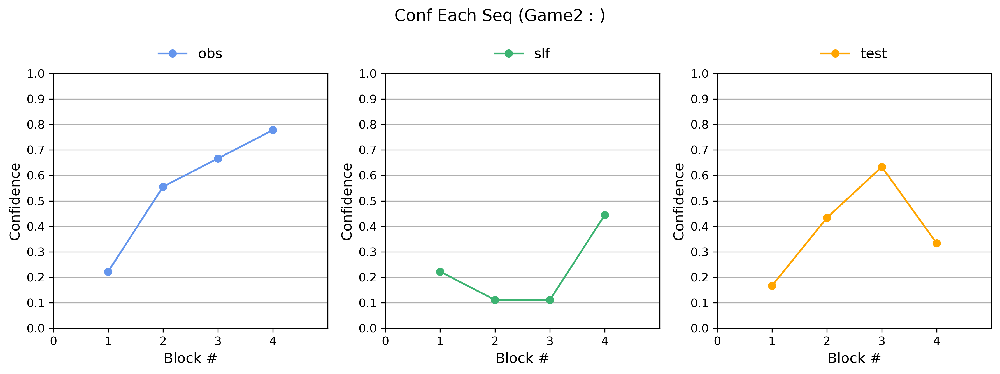

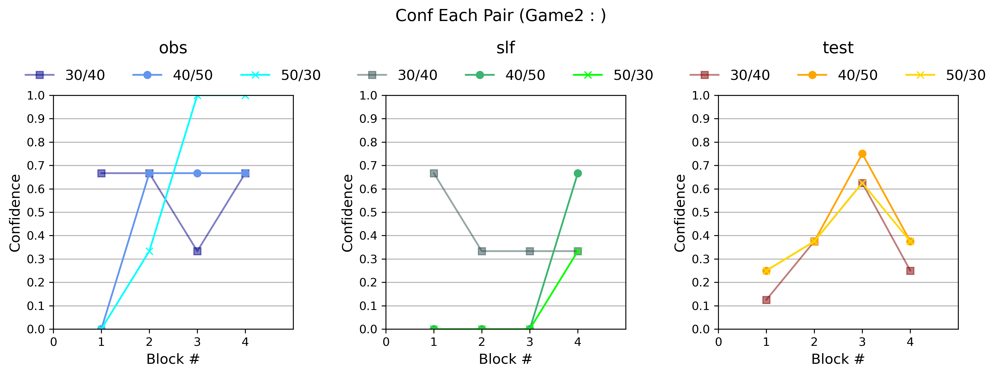

...

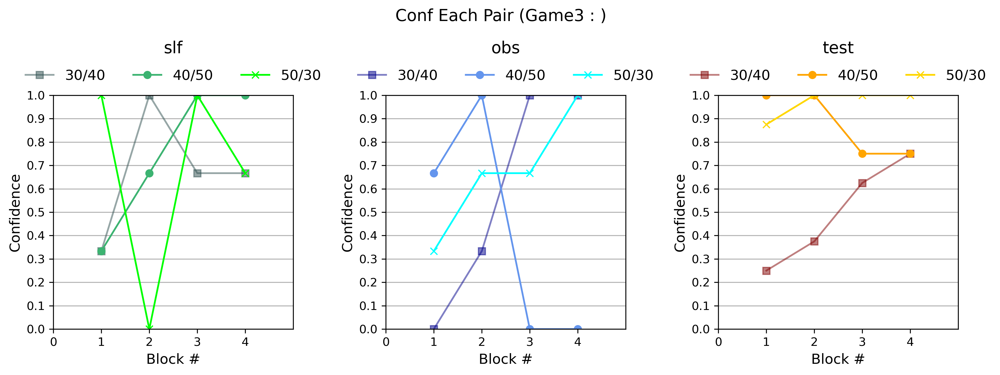

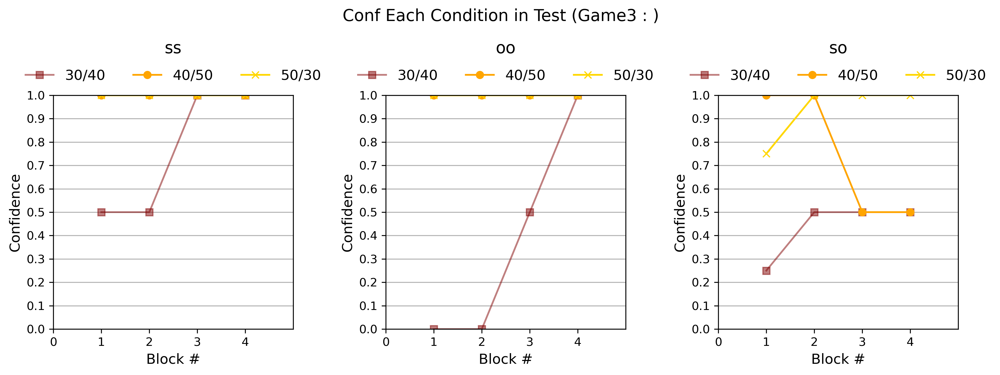

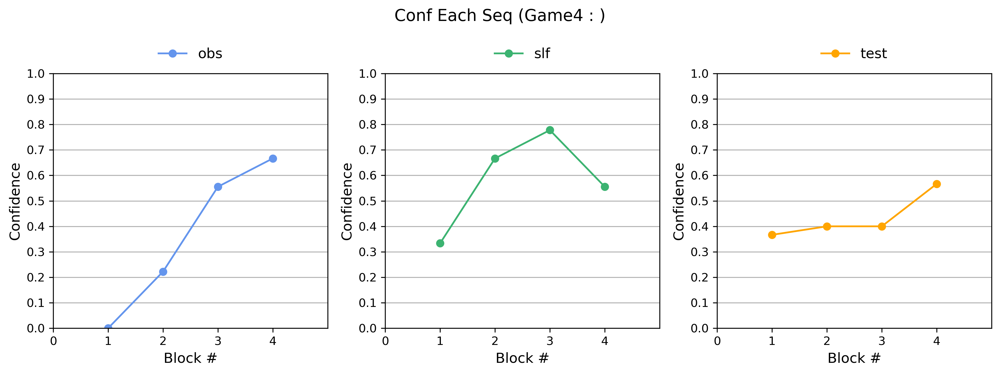

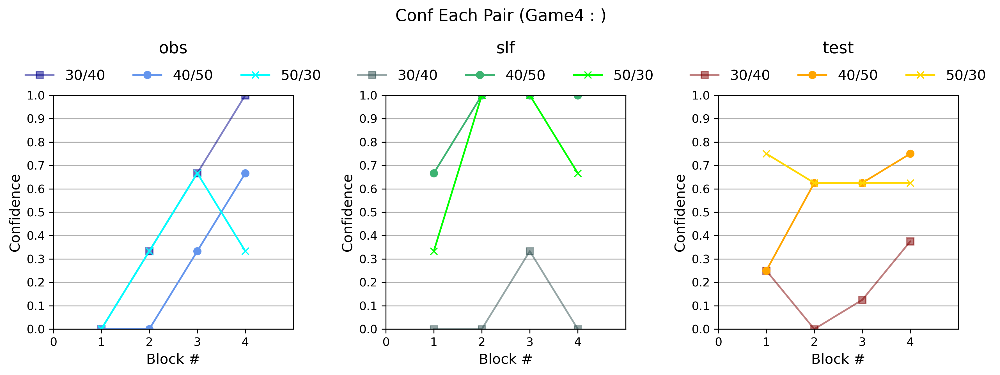

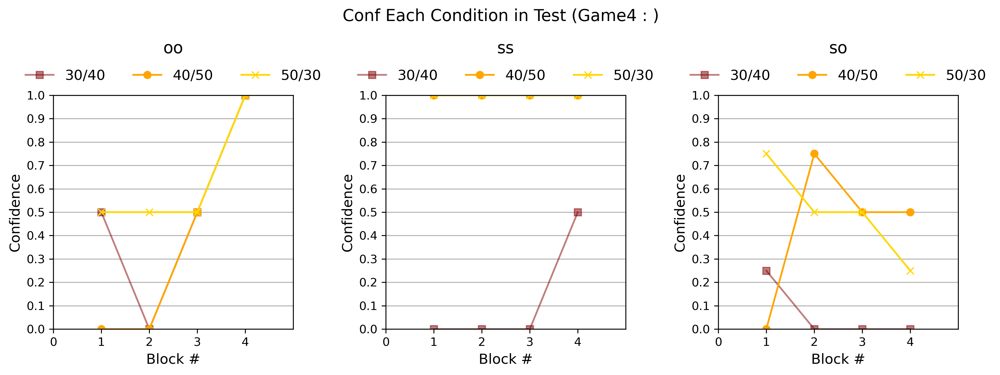

In [101]:
def conf_each_seq(ax, df, seq, width, color, xlim, ylim):
    df = df.select(pl.col('block_num', 'conf_num')).groupby('block_num').mean().sort(by='block_num')

    ax.plot(df.get_column('block_num'),
            df.get_column('conf_num'),
            label=seq,
            # width=width,
            color=color,
            marker='o'
            )
    ax.set_xlim(0, -~xlim)
    ax.set_ylim(0, ylim)
    ax.set_xticks(np.arange(0, -~xlim, step=1))
    ax.set_yticks(np.arange(0, ylim+.1, .1))
    ax.set_xlabel('Block #', fontsize=12)
    ax.set_ylabel('Confidence', fontsize=12)

    ax.grid(axis='y')
    ax.legend(loc='lower center', bbox_to_anchor=(.5,1), ncol=3, frameon=False, fontsize=12)


def conf_each_pair(ax, df, seq, pair, width, color, alpha, xlim, ylim):
    df = df.select(pl.col('block_num', 'pair_pat', 'conf_num')).groupby('block_num', 'pair_pat')\
        .mean().sort(by='block_num')

    df1 = df.filter(pl.col('pair_pat')==1)
    df2 = df.filter(pl.col('pair_pat')==2)
    df3 = df.filter(pl.col('pair_pat')==3)
    marker = ['s', 'o', 'x']

    for i, df_ in enumerate([df1, df2, df3]):
        ax.plot(df_.get_column('block_num'),
                df_.get_column('conf_num'),
                label=pair[i],
                # width=width,
                color=color[i],
                alpha=alpha[i],
                marker=marker[i]
                )

    ax.set_xlim(0, -~xlim)
    ax.set_ylim(0, ylim)
    ax.set_xticks(np.arange(0, -~xlim, step=1))
    ax.set_yticks(np.arange(0, ylim+.1, .1))
    ax.set_xlabel('Block #', fontsize=12)
    ax.set_ylabel('Confidence', fontsize=12)

    ax.set_title(seq, y=1.15, fontsize=14)
    ax.grid(axis='y')
    ax.legend(loc='lower center', bbox_to_anchor=(.5,1), ncol=3, frameon=False, fontsize=12)


def conf_each_cond(ax, df, cond, pair, width, color, alpha, xlim, ylim):
    df = df.select(pl.col('block_num', 'pair_pat', 'conf_num')).groupby('block_num', 'pair_pat')\
        .mean().sort(by='block_num')

    df1 = df.filter(pl.col('pair_pat')==1)
    df2 = df.filter(pl.col('pair_pat')==2)
    df3 = df.filter(pl.col('pair_pat')==3)
    marker = ['s', 'o', 'x']

    for i, df_ in enumerate([df1, df2, df3]):
        ax.plot(df_.get_column('block_num'),
                df_.get_column('conf_num'),
                label=pair[i],
                # width=width,
                color=color[i],
                alpha=alpha[i],
                marker=marker[i]
                )

    ax.set_xlim(0, -~xlim)
    ax.set_ylim(0, ylim)
    ax.set_xticks(np.arange(0, -~xlim, step=1))
    ax.set_yticks(np.arange(0, ylim+.1, .1))
    ax.set_xlabel('Block #', fontsize=12)
    ax.set_ylabel('Confidence', fontsize=12)

    ax.set_title(cond, y=1.15, fontsize=14)
    ax.grid(axis='y')
    ax.legend(loc='lower center', bbox_to_anchor=(.5,1), ncol=3, frameon=False, fontsize=12)


width = .5

xlim_so = 3
xlim_t = 3
ylim = 3

for game_pat in range(GAME):
    s, o = (0, 1) if game_pat%2==0 else (1, 0)
    
    # Each Sequence
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4.5), dpi=300, tight_layout=True, sharey=False)
    conf_each_seq(ax[s], integrated[game_pat+1].slf, SEQ_TYPES[0], width, COLORS[0], BLOCK, CONF_YLIM)
    conf_each_seq(ax[o], integrated[game_pat+1].obs, SEQ_TYPES[1], width, COLORS[1], BLOCK, CONF_YLIM)
    conf_each_seq(ax[2], integrated[game_pat+1].test, SEQ_TYPES[2], width, COLORS[2], BLOCK, CONF_YLIM)
    plt.suptitle(f'Conf Each Seq (Game{game_pat+1} : )', fontsize=14)
    
    # Each Pair
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4.5), dpi=300, tight_layout=True, sharey=False)
    conf_each_pair(ax[s], integrated[game_pat+1].slf, SEQ_TYPES[0], 
                PAIR_PATS, width, SLF_COLOR, alpha, BLOCK, CONF_YLIM)
    conf_each_pair(ax[o], integrated[game_pat+1].obs, SEQ_TYPES[1], 
                PAIR_PATS, width, OBS_COLOR, alpha, BLOCK, CONF_YLIM)
    conf_each_pair(ax[2], integrated[game_pat+1].test, SEQ_TYPES[2], 
                PAIR_PATS, width, TEST_COLOR, alpha, BLOCK, CONF_YLIM)
    plt.suptitle(f'Conf Each Pair (Game{game_pat+1} : )', fontsize=14)
    
    # Each Condition in Test
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4.5), dpi=300, tight_layout=True, sharey=False)
    conf_each_cond(ax[s], integrated[game_pat+1].test.filter(pl.col('condition')==1),
                    COND_PATS[0], PAIR_PATS, width, TEST_COLOR, alpha, BLOCK, CONF_YLIM)
    conf_each_cond(ax[o], integrated[game_pat+1].test.filter(pl.col('condition')==2),
                    COND_PATS[1], PAIR_PATS, width, TEST_COLOR, alpha, BLOCK, CONF_YLIM)
    conf_each_cond(ax[2], integrated[game_pat+1].test.filter(pl.col('condition')>=3),
                    COND_PATS[2], PAIR_PATS, width, TEST_COLOR, alpha, BLOCK, CONF_YLIM)
    plt.suptitle(f'Conf Each Condition in Test (Game{game_pat+1} : )', fontsize=14)

LとNLに決着はつかないが、同一視するということにする
温度が低くなればRTが早くなる
confをどうするか
behaviorのエントロピー
testの各ペアで整合性がとれているか（一致：high、不一致：low）
モデルからのuncertaintyとsubjのconfに相関があるか

学習はしていて、confも上昇しており期待するbehaviorではある
confがreliableであるかを確認する
->　fMRIに入れる（15人くらい）（時間を考慮する1スロットか2スロット）
吉田さんが5/9にいらっしゃるので、そのときに計画を話せるようにする

# Accuracy

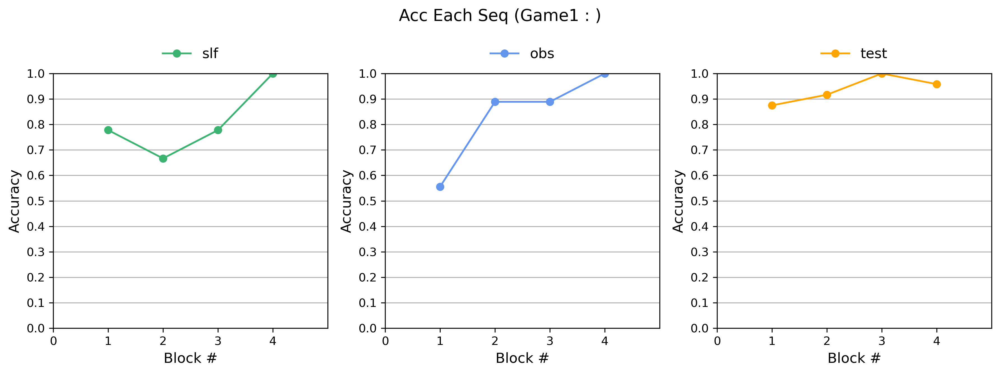

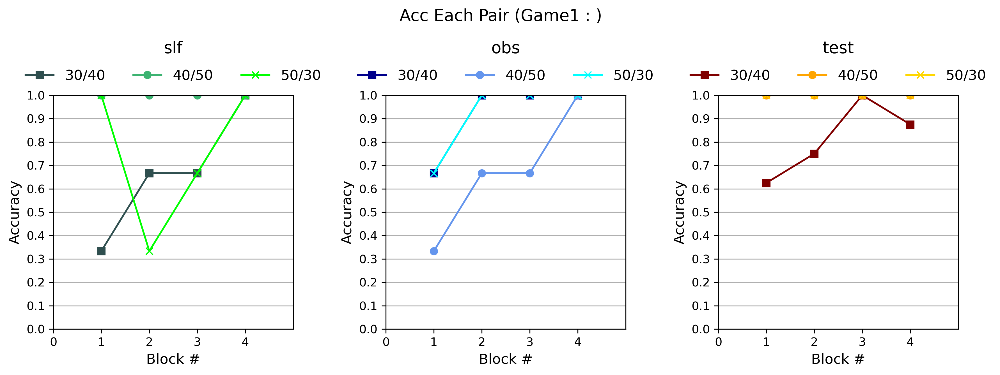

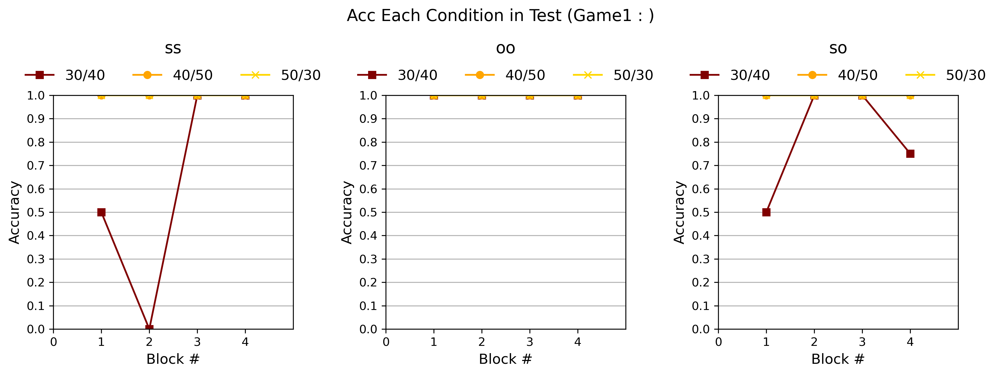

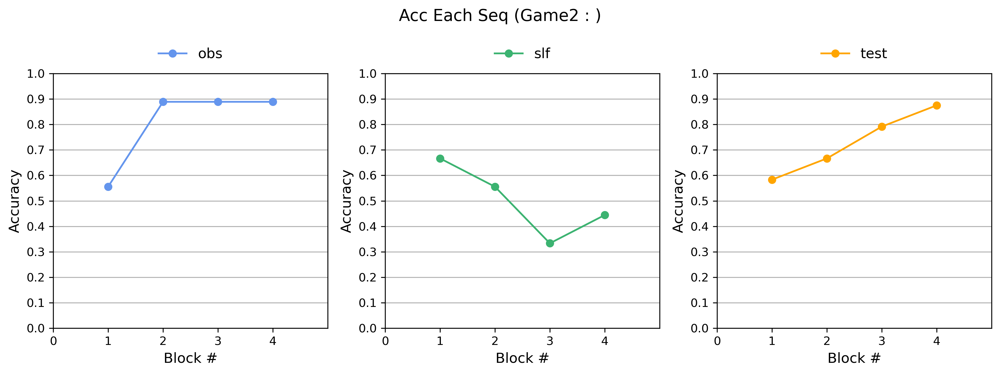

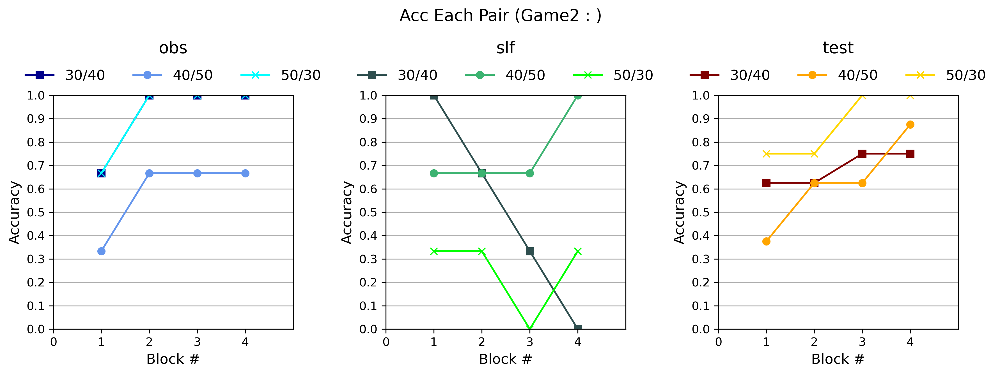

...

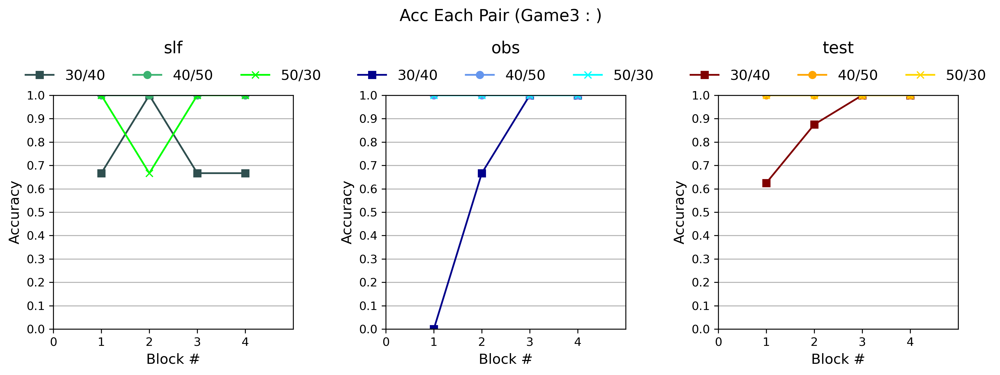

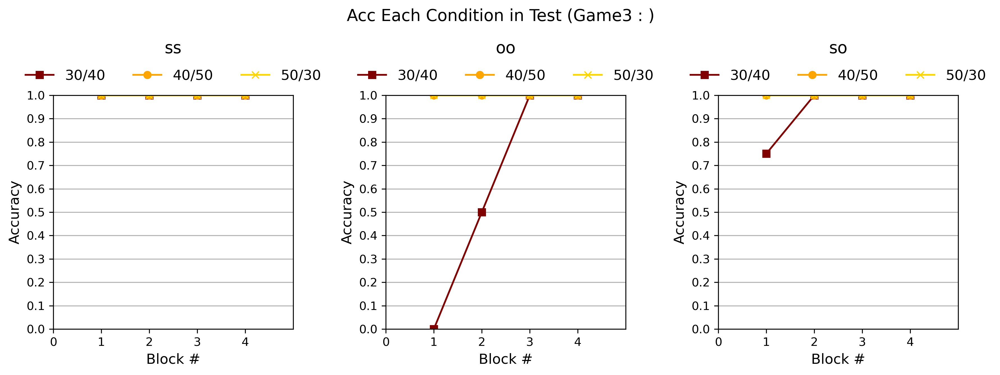

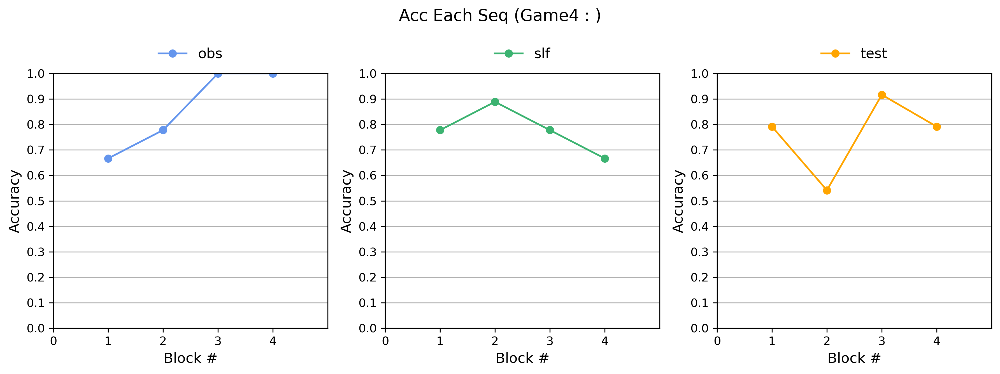

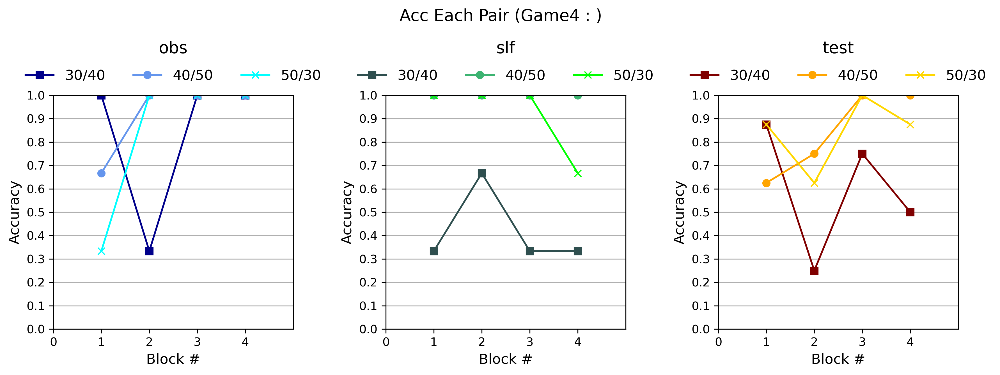

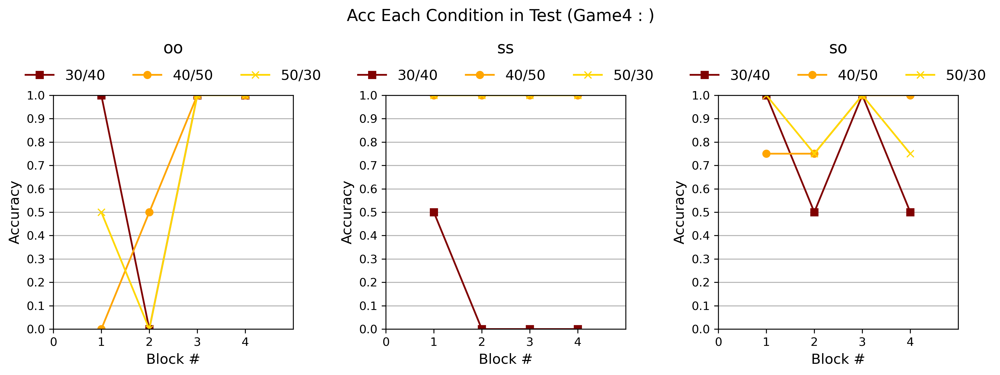

In [89]:
def acc_each_seq(ax, df, seq, width, color, xlim, ylim):
    df = df.filter(pl.col('pair_pat')<=3).select(pl.col('block_num', 'acc')).groupby('block_num').mean().sort(by='block_num')

    ax.plot(df.get_column('block_num'),
            df.get_column('acc'),
            label=seq,
            # width=width,
            color=color,
            marker='o'
            )

    ax.set_xlim(0, -~xlim)
    ax.set_ylim(0, ylim)
    ax.set_xticks(np.arange(0, -~xlim, step=1))
    ax.set_yticks(np.arange(0, ylim+.01, .1))
    ax.set_xlabel('Block #', fontsize=12)
    ax.set_ylabel('Accuracy', fontsize=12)

    ax.grid(axis='y')
    ax.legend(loc='lower center', bbox_to_anchor=(.5,1), ncol=3, frameon=False, fontsize=12)


def acc_each_pair(ax, df, seq, pair, width, color, alpha, xlim, ylim):
    df = df.filter(pl.col('pair_pat')<=3).select(pl.col('block_num', 'pair_pat', 'acc'))\
        .groupby('block_num', 'pair_pat').mean().sort(by='block_num')

    df1 = df.filter(pl.col('pair_pat')==1)
    df2 = df.filter(pl.col('pair_pat')==2)
    df3 = df.filter(pl.col('pair_pat')==3)
    marker = ['s', 'o', 'x']

    for i, df_ in enumerate([df1, df2, df3]):
        ax.plot(df_.get_column('block_num'),
                df_.get_column('acc'),
                label=pair[i],
                # width=width,
                color=color[i],
                alpha=alpha[i],
                marker=marker[i]
                )

    ax.set_xlim(0, -~xlim)
    ax.set_ylim(0, ylim)
    ax.set_xticks(np.arange(0, -~xlim, step=1))
    ax.set_yticks(np.arange(0, ylim+.01, .1))
    ax.set_xlabel('Block #', fontsize=12)
    ax.set_ylabel('Accuracy', fontsize=12)

    ax.set_title(seq, y=1.15, fontsize=14)
    ax.grid(axis='y')
    ax.legend(loc='lower center', bbox_to_anchor=(.5,1), ncol=3, frameon=False, fontsize=12)


def acc_each_cond(ax, df, cond, pair, width, color, alpha, xlim, ylim):
    df = df.filter(pl.col('pair_pat')<=3).select(pl.col('block_num', 'pair_pat', 'acc'))\
        .groupby('block_num', 'pair_pat').mean().sort(by='block_num')
    # df = df.select(pl.col('block', 'loc_pattern', 'conf')).groupby('block', 'loc_pattern')\
    #     .mean().sort(by='block')

    df1 = df.filter(pl.col('pair_pat')==1)
    df2 = df.filter(pl.col('pair_pat')==2)
    df3 = df.filter(pl.col('pair_pat')==3)
    marker = ['s', 'o', 'x']

    for i, df_ in enumerate([df1, df2, df3]):
        ax.plot(df_.get_column('block_num'),
                df_.get_column('acc'),
                label=pair[i],
                # width=width,
                color=color[i],
                alpha=alpha[i],
                marker=marker[i]
                )

    ax.set_xlim(0, -~xlim)
    ax.set_ylim(0, ylim)
    ax.set_xticks(np.arange(0, -~xlim, step=1))
    ax.set_yticks(np.arange(0, ylim+.01, .1))
    ax.set_xlabel('Block #', fontsize=12)
    ax.set_ylabel('Accuracy', fontsize=12)

    ax.set_title(cond, y=1.15, fontsize=14)
    ax.grid(axis='y')
    ax.legend(loc='lower center', bbox_to_anchor=(.5,1), ncol=3, frameon=False, fontsize=12)


gap = .31
width = .3
alpha = [1, 1, 1]
xlim_so = 3
xlim_t = 3
ylim = 1

for game_pat in range(GAME):
    s, o = (0, 1) if game_pat%2==0 else (1, 0)
    
    # Each Sequence
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4.5), dpi=300, tight_layout=True, sharey=False)
    acc_each_seq(ax[s], integrated[game_pat+1].slf, SEQ_TYPES[0], width, COLORS[0], BLOCK, ACC_YLIM)
    acc_each_seq(ax[o], integrated[game_pat+1].obs, SEQ_TYPES[1], width, COLORS[1], BLOCK, ACC_YLIM)
    acc_each_seq(ax[2], integrated[game_pat+1].test, SEQ_TYPES[2], width, COLORS[2], BLOCK, ACC_YLIM)
    plt.suptitle(f'Acc Each Seq (Game{game_pat+1} : )', fontsize=14)
    
    # Each Pair
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4.5), dpi=300, tight_layout=True, sharey=False)
    acc_each_pair(ax[s], integrated[game_pat+1].slf, SEQ_TYPES[0], 
                PAIR_PATS, width, SLF_COLOR, alpha, BLOCK, ACC_YLIM)
    acc_each_pair(ax[o], integrated[game_pat+1].obs, SEQ_TYPES[1], 
                PAIR_PATS, width, OBS_COLOR, alpha, BLOCK, ACC_YLIM)
    acc_each_pair(ax[2], integrated[game_pat+1].test, SEQ_TYPES[2], 
                PAIR_PATS, width, TEST_COLOR, alpha, BLOCK, ACC_YLIM)
    plt.suptitle(f'Acc Each Pair (Game{game_pat+1} : )', fontsize=14)
    
    # Each Condition in Test
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4.5), dpi=300, tight_layout=True, sharey=False)
    acc_each_cond(ax[s], integrated[game_pat+1].test.filter(pl.col('condition')==1),
                    COND_PATS[0], PAIR_PATS, width, TEST_COLOR, alpha, BLOCK, ACC_YLIM)
    acc_each_cond(ax[o], integrated[game_pat+1].test.filter(pl.col('condition')==2),
                    COND_PATS[1], PAIR_PATS, width, TEST_COLOR, alpha, BLOCK, ACC_YLIM)
    acc_each_cond(ax[2], integrated[game_pat+1].test.filter(pl.col('condition')>=3),
                    COND_PATS[2], PAIR_PATS, width, TEST_COLOR, alpha, BLOCK, ACC_YLIM)
    plt.suptitle(f'Acc Each Condition in Test (Game{game_pat+1} : )', fontsize=14)

# Individual analysis

### Consistency of Confidence in Test

We are currently investigating whether the confidence level in the test sequence is reliable.

Specifically, when an image pair that was selected with high confidence in the past is presented again, we examine whether the same image is selected with the same high confidence as before.

In [ ]:
def concistency_each_individual(ax, df, cond, pair, width, color, alpha, xlim, ylim):
    # df = df.filter(pl.col('loc_pattern')<=3).select(pl.col('block', 'loc_pattern', 'conf'))\
    #     .groupby('block', 'loc_pattern').mean().sort(by='block')

    df1 = df.filter(pl.col('loc_pattern')==1)
    df2 = df.filter(pl.col('loc_pattern')==2)
    df3 = df.filter(pl.col('loc_pattern')==3)
    duplicate = [0] * 3
    
    for i, df_ in enumerate([df1, df2, df3]):
        for block in range(1, 4):
            duplicate[block-1] = df_.filter(pl.col('block')==block).select('subj_No', 'block', 'conf')\
                                    .is_duplicated().sum() / 2

        ax.plot([1, 2 ,3],
                duplicate,
                label=pair[i],
                # width=width,
                color=color[i],
                # alpha=alpha[black-1],
                marker='o'
                )

    ax.set_xlim(0, -~xlim)
    ax.set_ylim(0, ylim)
    ax.set_xticks(np.arange(0, -~xlim, step=1))
    ax.set_yticks(np.arange(0, ylim+.1, 1))
    ax.set_xlabel('Block #', fontsize=12)
    ax.set_ylabel('Number of Participants', fontsize=12)

    ax.set_title(cond, y=1.15, fontsize=14)
    ax.grid(axis='y')
    ax.legend(loc='lower center', bbox_to_anchor=(.5,1), ncol=3, frameon=False, fontsize=12)


gap = .31
width = .3
alpha = [1, 1, 1]

xlim_so = 3
xlim_t = 3
ylim = 15

for pat in range(1, 3):
    fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(8, 4), dpi=300, tight_layout=True, sharey=False)
    
    concistency_each_individual(ax[0], integrated[pat].test.filter(pl.col('seq_pattern')=='ss'),
                    'SS', pair_label, width, color_test, alpha, xlim_t, ylim)
    concistency_each_individual(ax[1], integrated[pat].test.filter(pl.col('seq_pattern')=='oo'),
                    'OO', pair_label, width, color_test, alpha, xlim_t, ylim)
    # concistency_each_individual(ax[2], integrated[pat].test.filter(pl.col('seq_pattern')>='so'),
    #                 'SO', pair_label, width, color_test, alpha, xlim_t, ylim)

    plt.suptitle(f'Number of Participants whose \nConfidence Choices were Consistent in Each Condition in Test', fontsize=14)

In [ ]:
def prefer_each_pair(ax, df, seq, gap, width, color, xlim, ylim):
    df = df.filter(pl.col('loc_pattern')>=4)
    df = df.with_columns(pl.when(pl.col('img_choice')==0).then(df['idx_left'])
                                        .otherwise(df['idx_right']).alias('preferred'))
    df = df.get_column('preferred').value_counts().sort('preferred')
    df = df.with_columns((pl.col('counts') / 90).alias('preferred rate'))
    
    df_s = df.filter(pl.col('preferred') <= 3).with_columns(pl.when(pl.col('preferred')==1).then(30)
                                                            .when(pl.col('preferred')==2).then(40)
                                                            .otherwise(50).alias('loc_preferred'))
    df_o = df.filter(pl.col('preferred') >= 4).with_columns(pl.when(pl.col('preferred')==4).then(30)
                                                            .when(pl.col('preferred')==5).then(40)
                                                            .otherwise(50).alias('loc_preferred'))

    for i, df_ in enumerate([df_s, df_o]):
        ax.bar(df_.get_column('loc_preferred')+gap[i],
                df_.get_column('preferred rate'),
                label=seq[i],
                width=width,
                color=color[i],
                # marker='o'
                )
    ax.set_xlim(25, 55)
    ax.set_ylim(0, ylim)
    ax.set_xticks(np.arange(30, 60, step=10))
    ax.set_yticks(np.arange(0, ylim+.1, .5))
    ax.set_xlabel('Loc', fontsize=12)
    ax.set_ylabel('Preferred Rate', fontsize=12)

    ax.grid(axis='y')
    ax.legend(loc='lower center', bbox_to_anchor=(.5,1), ncol=3, frameon=False, fontsize=12)


gap = [-1, 1]
width = 2

xlim_t = 3
ylim = 1

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 4.5), dpi=300, tight_layout=True, sharey=False)
for pat in range(1, 3):    
    prefer_each_pair(ax[pat-1], integrated[pat].test, seq_label, gap, width, colors, xlim_t, ylim)
    
    ax[pat-1].set_title(f'Preferred Choice in SO (Pattern{pat} : {pat_label[pat-1]})', y=1.15, fontsize=14)

In [ ]:
integrated[1].slf

In [ ]:
def prefer_each_block_so(ax, df, loc, seq, label, gap, width, color, xlim, ylim, x_label):
    ax2 = ax.twinx()
    df_conf = df.select('block', 'conf').groupby('block').mean().sort('block')

    ax2.plot(df_conf.get_column('block'),
            df_conf.get_column('conf'),
            label=label,
            # width=width,
            color=color,
            marker='o'
            )
    
    ax2.set_xlim(0, -~xlim)
    ax2.set_ylim(0, ylim)
    ax2.set_xticks(np.arange(0, -~xlim, step=1))
    ax2.set_yticks(np.arange(0, 3.1, .5))
    ax2.set_ylabel('Confidence', fontsize=12)
    ax2.grid(axis='y')
    ax2.legend(loc='lower center', bbox_to_anchor=(x_label,1), ncol=3, frameon=False, fontsize=12)

def prefer_each_block(ax, df, loc, seq, pair, gap, width, color, xlim, ylim):
    df = df.with_columns(pl.when(pl.col('img_choice')==0).then(df['idx_left'])
                                .otherwise(df['idx_right']).alias('preferred'))
    df_choice = df.select('block', 'preferred').groupby('block', 'preferred').count().sort('block', 'preferred')
    df_choice = df_choice.with_columns((pl.col('count') / 30).alias('preferred rate'))
    
    df_choice_s = df_choice.filter(pl.col('preferred') == loc)
    df_choice_o = df_choice.filter(pl.col('preferred') == loc+3)

    for i, df_ in enumerate([df_choice_s, df_choice_o]):
        ax.bar(df_.get_column('block')+gap[i],
                df_.get_column('preferred rate'),
                label=seq[i],
                width=width,
                color=color[i],
                # marker='o'
                )

    ax2 = ax.twinx()
    df_conf = df.select('block', 'conf').groupby('block').mean().sort('block')

    ax2.plot(df_conf.get_column('block'),
            df_conf.get_column('conf'),
            label='conf_test',
            # width=width,
            color='k',
            marker='o'
            )
    
    ax.set_xlim(0, -~xlim)
    ax.set_ylim(0, ylim)
    ax.set_xticks(np.arange(0, -~xlim, step=1))
    ax.set_yticks(np.arange(0, ylim+.1, .5))
    ax.set_xlabel('Block #', fontsize=12)
    ax.set_ylabel('Preferred Rate', fontsize=12)
    ax.grid(axis='y')
    ax.legend(loc='lower center', bbox_to_anchor=(.5,1.2), ncol=3, frameon=False, fontsize=12)
    ax.set_title(pair[loc-1], y=1.33, fontsize=14)

    ax2.set_ylim(0, ylim)
    ax2.set_yticks(np.arange(0, 3.1, .5))
    ax2.set_ylabel('Confidence', fontsize=12)
    ax2.grid(axis='y')
    ax2.legend(loc='lower center', bbox_to_anchor=(.5,1.1), ncol=3, frameon=False, fontsize=12)


gap = [-.15, .15]
width = .3

xlim_t = 3
ylim = 1
pair_label2 = ['30/30', '40/40', '50/50']

for pat in range(1, 3):
    fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4.5), dpi=300, tight_layout=True, sharey=False)
    prefer_each_block_so(ax[0], integrated[pat].slf.filter(pl.col('idx_choice')==1), 1, seq_label, 'conf_slf', gap, width, color_slf[2], xlim_t, ylim, x_label=.2)
    prefer_each_block_so(ax[1], integrated[pat].slf.filter(pl.col('idx_choice')==2), 2, seq_label, 'conf_slf', gap, width, color_slf[2], xlim_t, ylim, x_label=.2)
    prefer_each_block_so(ax[2], integrated[pat].slf.filter(pl.col('idx_choice')==3), 3, seq_label, 'conf_slf', gap, width, color_slf[2], xlim_t, ylim, x_label=.2)
    prefer_each_block_so(ax[0], integrated[pat].obs.filter(pl.col('idx_choice')==1), 1, seq_label, 'conf_obs', gap, width, color_obs[2], xlim_t, ylim, x_label=.8)
    prefer_each_block_so(ax[1], integrated[pat].obs.filter(pl.col('idx_choice')==2), 2, seq_label, 'conf_obs', gap, width, color_obs[2], xlim_t, ylim, x_label=.8)
    prefer_each_block_so(ax[2], integrated[pat].obs.filter(pl.col('idx_choice')==3), 3, seq_label, 'conf_obs', gap, width, color_obs[2], xlim_t, ylim, x_label=.8)
    prefer_each_block(ax[0], integrated[pat].test.filter(pl.col('loc_pattern')==4), 1, seq_label, pair_label2, gap, width, colors, xlim_t, ylim)
    prefer_each_block(ax[1], integrated[pat].test.filter(pl.col('loc_pattern')==5), 2, seq_label, pair_label2, gap, width, colors, xlim_t, ylim)
    prefer_each_block(ax[2], integrated[pat].test.filter(pl.col('loc_pattern')==6), 3, seq_label, pair_label2, gap, width, colors, xlim_t, ylim)
    2
    plt.suptitle(f'Preferred Choice in SO (Pattern{pat} : {pat_label[pat-1]})', fontsize=14)

# Statistical Test

In [ ]:
def mannwhitneyu_test_group(t1, t2):
    p =[0 for _ in range(9)]

    for bi in range(3):
        arr_ss1 = t1[(t1['seq_pattern']==1) & (t1['block']==bi+1)].groupby('subj').mean()['pt']
        arr_ss2 = t2[(t2['seq_pattern']==1) & (t2['block']==bi+1)].groupby('subj').mean()['pt']

        arr_oo1 = t1[(t1['seq_pattern']==2) & (t1['block']==bi+1)].groupby('subj').mean()['pt']
        arr_oo2 = t2[(t2['seq_pattern']==2) & (t2['block']==bi+1)].groupby('subj').mean()['pt']

        arr_so1 = t1[(t1['seq_pattern']>=3) & (t1['loc_pattern']<=3) & (t1['block']==bi+1)].groupby('subj').mean()['pt']
        arr_so2 = t2[(t2['seq_pattern']>=3) & (t2['loc_pattern']<=3) & (t2['block']==bi+1)].groupby('subj').mean()['pt']

        p[bi]   = stats.mannwhitneyu(arr_ss1, arr_ss2, alternative='two-sided').pvalue
        p[bi+3] = stats.mannwhitneyu(arr_oo1, arr_oo2, alternative='two-sided').pvalue
        p[bi+6] = stats.mannwhitneyu(arr_so1, arr_so2, alternative='two-sided').pvalue

    return p


def binomial_test_chance(t):
    p =[0 for _ in range(9)]
    block = [1, 2, 3]

    for bi in block:
        arr_ss = t[(t['seq_pattern']==1) & (t['block']==bi)]['pt']
        corr_ss = np.count_nonzero(arr_ss == 1)

        arr_oo = t[(t['seq_pattern']==2) & (t['block']==bi)]['pt']
        corr_oo = np.count_nonzero(arr_oo == 1)

        arr_so = t[(t['seq_pattern']>=3) & (t['loc_pattern']<=3) & (t['block']==bi)]['pt']
        corr_so = np.count_nonzero(arr_so == 1)

        p[bi-1] = stats.binomtest(corr_ss, len(arr_ss), 0.5, 'greater').pvalue
        p[bi+2] = stats.binomtest(corr_oo, len(arr_oo), 0.5, 'greater').pvalue
        p[bi+5] = stats.binomtest(corr_so, len(arr_so), 0.5, 'greater').pvalue

    return p


def wilcoxon_test_diff(t):
    p =[0 for _ in range(6)]

    for bi in range(2):
        arr_ss1 = t[(t['seq_pattern']==1) & (t['block']==bi+1)].groupby('subj').mean()['pt']
        arr_ss2 = t[(t['seq_pattern']==1) & (t['block']==bi+2)].groupby('subj').mean()['pt']

        arr_oo1 = t[(t['seq_pattern']==2) & (t['block']==bi+1)].groupby('subj').mean()['pt']
        arr_oo2 = t[(t['seq_pattern']==2) & (t['block']==bi+2)].groupby('subj').mean()['pt']

        arr_so1 = t[(t['seq_pattern']>=3) & (t['loc_pattern']<=3) & (t['block']==bi+1)].groupby('subj').mean()['pt']
        arr_so2 = t[(t['seq_pattern']>=3) & (t['loc_pattern']<=3) & (t['block']==bi+2)].groupby('subj').mean()['pt']

        p[bi]   = stats.wilcoxon(arr_ss1, arr_ss2, zero_method='zsplit', alternative='less').pvalue
        p[bi+2] = stats.wilcoxon(arr_oo1, arr_oo2, zero_method='zsplit', alternative='less').pvalue
        p[bi+4] = stats.wilcoxon(arr_so1, arr_so2, zero_method='zsplit', alternative='less').pvalue

    return p


def wilcoxon_test_diff2(t):
    p =[0 for _ in range(3)]

    arr_ss1 = t[(t['seq_pattern']==1) & (t['block']==1)].groupby('subj').mean()['pt']
    arr_ss2 = t[(t['seq_pattern']==1) & (t['block']==3)].groupby('subj').mean()['pt']

    arr_oo1 = t[(t['seq_pattern']==2) & (t['block']==1)].groupby('subj').mean()['pt']
    arr_oo2 = t[(t['seq_pattern']==2) & (t['block']==3)].groupby('subj').mean()['pt']

    arr_so1 = t[(t['seq_pattern']>=3) & (t['loc_pattern']<=3) & (t['block']==1)].groupby('subj').mean()['pt']
    arr_so2 = t[(t['seq_pattern']>=3) & (t['loc_pattern']<=3) & (t['block']==3)].groupby('subj').mean()['pt']

    p[0]   = stats.wilcoxon(arr_ss1, arr_ss2, zero_method='zsplit', alternative='less').pvalue
    p[1] = stats.wilcoxon(arr_oo1, arr_oo2, zero_method='zsplit', alternative='less').pvalue
    p[2] = stats.wilcoxon(arr_so1, arr_so2, zero_method='zsplit', alternative='less').pvalue

    return p


def wilcoxon_test_pat(t1, t2):
    p =[0 for _ in range(9)]

    for bi in range(3):
        arr_ss1 = t1[(t1['seq_pattern']==1) & (t1['block']==bi+1)].groupby('subj').mean()['pt']
        arr_ss2 = t2[(t2['seq_pattern']==1) & (t2['block']==bi+1)].groupby('subj').mean()['pt']

        arr_oo1 = t1[(t1['seq_pattern']==2) & (t1['block']==bi+1)].groupby('subj').mean()['pt']
        arr_oo2 = t2[(t2['seq_pattern']==2) & (t2['block']==bi+1)].groupby('subj').mean()['pt']

        arr_so1 = t1[(t1['seq_pattern']>=3) & (t1['loc_pattern']<=3) & (t1['block']==bi+1)].groupby('subj').mean()['pt']
        arr_so2 = t2[(t2['seq_pattern']>=3) & (t2['loc_pattern']<=3) & (t2['block']==bi+1)].groupby('subj').mean()['pt']

        p[bi]   = stats.wilcoxon(arr_ss1, arr_ss2, alternative='greater').pvalue
        p[bi+3] = stats.wilcoxon(arr_oo1, arr_oo2, alternative='greater').pvalue
        p[bi+6] = stats.wilcoxon(arr_so1, arr_so2, alternative='greater').pvalue

    return p

In [ ]:
print('\n','between groups : U two-sided')
for i in range(2):
    pvalue = mannwhitneyu_test_group(integrated_data_1[i][2], integrated_data_2[i][2])
    print(f'pattern{i+1} : {pvalue}')

print('\n','chance level : Binomial greater')
for i in range(2):
    pvalue = binomial_test_chance(integrated_data_0[i][2])
    print(f'pattern{i+1} : {np.max(pvalue)}')

print('\n','between blocks : Wilcoxon less')
for i in range(2):
    pvalue = wilcoxon_test_diff(integrated_data_1[i][2])
    print(f'pattern{i+1}, blocks : {pvalue}')

print('\n','between block1 to 3 : Wilcoxon less')
for i in range(2):
    pvalue = wilcoxon_test_diff2(integrated_data_0[i][2])
    print(f'pattern{i+1}, b1-b3 : {pvalue}')

print('\n','between patterns : Wilcoxon less')
pvalue = wilcoxon_test_pat(integrated_data_0[0][2], integrated_data_0[1][2])
print(f'pattern1-pattern2 : {pvalue}')

In [ ]:
def negative_likelihood(df, ax, col, gap, label, width, ymax, color, transparency):
    capsize = 3
    df_ll = df[['pattern', col]]
    sem_ll = [df_ll[df_ll['pattern']==i][col].sem() for i in [1,2]]
    df_ll = df_ll.pivot_table(index='pattern', values=col, aggfunc=np.mean)

    ax.plot(df_ll.index+gap, -df_ll[col], label=label, width=width, color=color, alpha=transparency, yerr=sem_ll, capsize=capsize)

    ax.set_xlim(0, 3)
    ax.set_ylim(0, ymax)
    ax.set_xticks(np.arange(1, 3, step=1), fontsize=18)
    ax.set_yticks(np.arange(0, ymax+.1, step=1), fontsize=18)
    ax.set_xlabel('Pattern', fontsize=20)
    ax.set_ylabel('Negative Log-Likelihood', fontsize=20)
    ax.legend(loc='lower center', bbox_to_anchor=(.5,1), ncol=3, frameon=False, fontsize=20)
    # ax.set_title(T_title_label[i], x=.5, y=1.15, fontsize=20)


def negative_likelihood_so(df, ax, col, gap, label, width, ymax, ystep, color, transparency):
    capsize = 3

    df_ll = df[['pattern', col]]
    sem_ll = [df_ll[df_ll['pattern']==i][col].sem() for i in [1,2]]
    df_ll = df_ll.pivot_table(index='pattern', values=col, aggfunc=np.mean)

    ax.plot(df_ll.index+gap, -df_ll[col], label=label, width=width, color=color, alpha=transparency, yerr=sem_ll, capsize=capsize)

    ax.set_xlim(0, 3)
    ax.set_ylim(0, ymax)
    ax.set_xticks(np.arange(1, 3, step=1), fontsize=18)
    ax.set_yticks(np.arange(0, ymax+.1, step=ystep), fontsize=18)
    ax.set_xlabel('Pattern', fontsize=20)
    ax.set_ylabel('Negative Log-Likelihood', fontsize=20)
    ax.legend(loc='lower center', bbox_to_anchor=(.5,1), ncol=3, frameon=False, fontsize=20)
    # ax.set_title(T_title_label[i], x=.5, y=1.15, fontsize=20)

# Reinforcement Learning (RL)

### Most Likelihood Estimation (MLE)

In [ ]:
df = pd.read_excel('params.xlsx')
corr1 = df[df['pattern']==1][['alpha_MLE', 'beta_MLE']].corr()
corr2 = df[df['pattern']==2][['alpha_MLE', 'beta_MLE']].corr()

fig, ax = plt.subplots(figsize=(6,6), dpi=300)
ax.scatter(df[df['pattern']==1]['alpha_MLE'], df[df['pattern']==1]['beta_MLE'], marker='o', s=50, label='pattern1')
ax.scatter(df[df['pattern']==2]['alpha_MLE'], df[df['pattern']==2]['beta_MLE'], marker='o', s=50, label='pattern2')

ax.set_xlim(0, 0.7)
ax.set_ylim(0.025, 0.225)
ax.set_xlabel('alpha', fontsize=24)
ax.set_ylabel('beta', fontsize=24)
ax.grid()
ax.legend(loc='lower center', bbox_to_anchor=(.5,1), ncol=3, frameon=False, fontsize=16)

In [ ]:
sns.heatmap(corr1, vmin=-1.0, vmax=1.0, cmap='Blues'  , center=0, annot=True, fmt='.2f', square=True)

In [ ]:
sns.heatmap(corr2, vmin=-1.0, vmax=1.0, cmap='Oranges', center=0, annot=True, fmt='.2f', square=True)

### Comarison of Negative Log-likelihood

In [ ]:
df_ss = pd.read_excel('result_ss.xlsx')
width = .4
gap = .21
transparency = .7
ymax = 10

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 8), dpi=300, tight_layout=True)
negative_likelihood(df_ss, ax, 'll_softmax',  -gap, 'softmax',  width, ymax, 'lightgreen', 1)
negative_likelihood(df_ss, ax, 'll_matching',  gap, 'matching', width, ymax, 'coral',      0.7)

ax.grid(axis='y')
plt.show()

print('between patterns : Wilcoxon less')
pvalue1 = stats.wilcoxon(-(df_ss[df_ss['pattern']==1]['ll_softmax']), -(df_ss[df_ss['pattern']==1]['ll_matching']), alternative='less').pvalue
pvalue2 = stats.wilcoxon(-(df_ss[df_ss['pattern']==2]['ll_softmax']), -(df_ss[df_ss['pattern']==2]['ll_matching']), alternative='less').pvalue
print(f'pattern1, softmax-matching : {pvalue1}')
print(f'pattern2, softmax-matching : {pvalue2}')

# Inverse Reinforcement Learning (IRL)

### Comarison of Negative Log-likelihood

In [ ]:
# pd.set_option('display.max_rows', None)
df_oo = pd.read_excel('result_oo.xlsx')
width = .4
gap = .21
transparency = .7
ymax = 10

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 8), dpi=300, tight_layout=True)
negative_likelihood(df_oo, ax, 'll_softmax', -gap, 'OO', width, ymax, 'lightgreen', 1)
negative_likelihood(df_ss, ax, 'll_softmax',  gap, 'SS', width, ymax,      'coral', 0.7)

ax.grid(axis='y')
plt.show()

print('between conditions, oo-ss : Wilcoxon two-sided')
pvalue1 = stats.wilcoxon(-(df_oo[df_oo['pattern']==1]['ll_softmax']), -(df_ss[df_ss['pattern']==1]['ll_softmax']), alternative='two-sided').pvalue
pvalue2 = stats.wilcoxon(-(df_oo[df_oo['pattern']==2]['ll_softmax']), -(df_ss[df_ss['pattern']==2]['ll_softmax']), alternative='two-sided').pvalue
print(f'pattern1, oo-ss : {pvalue1}')
print(f'pattern2, oo-ss : {pvalue2}')

# Integration of learning

### Comarison of Negative Log-likelihood

In [ ]:
df_so_10 = pd.read_excel('result_so m=1.0.xlsx')
df_so_07 = pd.read_excel('result_so m=0.7.xlsx')
df_so_13 = pd.read_excel('result_so m=1.3.xlsx')

width = .24
gap = width+.01
transparency = .7
ymax = 45
ytick = 5

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 8), dpi=300, tight_layout=True)
negative_likelihood_so(df_so_10, ax, 'll_softmax', -gap,    'm_slf', width, ymax, ytick, 'lightgreen', 1)
negative_likelihood_so(df_so_07, ax, 'll_softmax',    0, '0.7m_slf', width, ymax, ytick, 'skyblue', 1)
negative_likelihood_so(df_so_13, ax, 'll_softmax',  gap, '1.3m_slf', width, ymax, ytick, 'coral', 0.7)

ax.grid(axis='y')
plt.show()

print('between initials, so : Wilcoxon less')
pvalue1_1007 = stats.wilcoxon(-(df_so_10[df_so_10['pattern']==1]['ll_softmax']), -(df_so_07[df_so_07['pattern']==1]['ll_softmax']), alternative='less').pvalue
pvalue2_1007 = stats.wilcoxon(-(df_so_10[df_so_10['pattern']==2]['ll_softmax']), -(df_so_07[df_so_07['pattern']==2]['ll_softmax']), alternative='less').pvalue
pvalue1_1013 = stats.wilcoxon(-(df_so_10[df_so_10['pattern']==1]['ll_softmax']), -(df_so_13[df_so_13['pattern']==1]['ll_softmax']), alternative='less').pvalue
pvalue2_1013 = stats.wilcoxon(-(df_so_10[df_so_10['pattern']==2]['ll_softmax']), -(df_so_13[df_so_13['pattern']==2]['ll_softmax']), alternative='less').pvalue

print(f'pattern1, 1.0-0.7 : {pvalue1_1007}')
print(f'pattern2, 1.0-0.7 : {pvalue2_1007}')
print(f'pattern1, 1.0-1.3 : {pvalue1_1013}')
print(f'pattern2, 1.0-1.3 : {pvalue2_1013}')

# Confidece Evaluation

### Comarison of Negative Log-likelihood

In [ ]:
df_oo_conf = pd.read_excel('result_oo_conf.xlsx')
width = .4
gap = .21
transparency = .7
ymax = 10

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 8), dpi=300, tight_layout=True)
negative_likelihood(df_oo_conf, ax, 'll_softmax', -gap, 'confidence', width, ymax, 'lightgreen', 1)
negative_likelihood(     df_oo, ax, 'll_softmax',  gap, 'normal', width, ymax, 'coral', 0.7)

ax.grid(axis='y')
plt.show()

print('between patterns, oo : Wilcoxon less')
pvalue1 = stats.wilcoxon(-(df_oo_conf[df_oo_conf['pattern']==1]['ll_softmax']), -(df_oo[df_oo['pattern']==1]['ll_softmax']), alternative='less').pvalue
pvalue2 = stats.wilcoxon(-(df_oo_conf[df_oo_conf['pattern']==2]['ll_softmax']), -(df_oo[df_oo['pattern']==2]['ll_softmax']), alternative='less').pvalue
print(f'pattern1, conf-normal : {pvalue1}')
print(f'pattern2, conf-normal : {pvalue2}')


df_so_conf = pd.read_excel('result_so_conf.xlsx')
df_so      = pd.read_excel('result_so m=1.0.xlsx')
width = .4
gap = .21
transparency = .7
ymax = 40
ytick = 5

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(8, 8), dpi=300, tight_layout=True)
negative_likelihood_so(df_so_conf, ax, 'll_softmax', -gap, 'confidence', width, ymax, ytick, 'lightgreen', 1)
negative_likelihood_so(     df_so, ax, 'll_softmax',  gap, 'normal', width, ymax, ytick,      'coral', 0.7)

ax.grid(axis='y')
plt.show()

print('between patterns, so : Wilcoxon less')
pvalue1 = stats.wilcoxon(-(df_so_conf[df_so_conf['pattern']==1]['ll_softmax']), -(df_so[df_so['pattern']==1]['ll_softmax']), alternative='less').pvalue
pvalue2 = stats.wilcoxon(-(df_so_conf[df_so_conf['pattern']==2]['ll_softmax']), -(df_so[df_so['pattern']==2]['ll_softmax']), alternative='less').pvalue
print(f'pattern1, conf-normal : {pvalue1}')
print(f'pattern2, conf-normal : {pvalue2}')

In [ ]:
def value_diff(df, ax):
    capsize = 3
    diff_1112 = df[df['pattern']==1]['q_12']-df[df['pattern']==1]['q_11']
    diff_1123 = df[df['pattern']==1]['q_13']-df[df['pattern']==1]['q_12']
    diff_1212 = df[df['pattern']==1]['q_22']-df[df['pattern']==1]['q_21']
    diff_1223 = df[df['pattern']==1]['q_23']-df[df['pattern']==1]['q_22']
    diff_1312 = df[df['pattern']==1]['q_32']-df[df['pattern']==1]['q_31']
    diff_1323 = df[df['pattern']==1]['q_33']-df[df['pattern']==1]['q_32']
    diff_2112 = df[df['pattern']==2]['q_12']-df[df['pattern']==2]['q_11']
    diff_2123 = df[df['pattern']==2]['q_13']-df[df['pattern']==2]['q_12']
    diff_2212 = df[df['pattern']==2]['q_22']-df[df['pattern']==2]['q_21']
    diff_2223 = df[df['pattern']==2]['q_23']-df[df['pattern']==2]['q_22']
    diff_2312 = df[df['pattern']==2]['q_32']-df[df['pattern']==2]['q_31']
    diff_2323 = df[df['pattern']==2]['q_33']-df[df['pattern']==2]['q_32']

    ax.scatter(diff_1112, diff_1123, label='p1_b1', color='b', marker='o')
    ax.scatter(diff_1212, diff_1223, label='p1_b2', color='b', marker='x')
    ax.scatter(diff_1312, diff_1323, label='p1_b3', color='b', marker='^')
    ax.scatter(diff_2112, diff_1223, label='p2_b1', color='r', marker='o')
    ax.scatter(diff_2212, diff_2223, label='p2_b2', color='r', marker='x')
    ax.scatter(diff_2312, diff_2323, label='p2_b3', color='r', marker='^')

    ax.set_xlim(-10, 50)
    ax.set_ylim(-20, 30)
    ax.set_xticks(np.arange(-10, 50, step=5))
    ax.set_yticks(np.arange(-20, 30, step=5))
    ax.set_xlabel('diff_12', fontsize=18)
    ax.set_ylabel('diff_23', fontsize=18)
    ax.legend(loc='lower center', bbox_to_anchor=(.5,1), ncol=3, frameon=False, fontsize=10)
    # ax.set_title(T_title_label[i], x=.5, y=1.15, fontsize=20)

In [ ]:
width = .4
gap = .21
transparency = .7
ymax = 10

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 5), dpi=300, tight_layout=True)
value_diff(df_oo_conf, ax[0])
value_diff(     df_oo, ax[1])

ax[0].grid()
ax[1].grid()
plt.show()

In [ ]:
def diff_accuracy(df):
    for si in range(subj_num):
        df = df[(df['subj']==si+1) & (df['subj']==si+1) & (df['subj']==si+1)]


In [ ]:
dft1 = integrated_data_0[0][2]
dft1 = dft1[dft1['loc_pattern']>=4]
dft2 = integrated_data_0[1][2]
dft2 = dft2[dft2['loc_pattern']>=4]

In [ ]:


width = .4
gap = .21
transparency = .7
ymax = 10

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 5), dpi=300, tight_layout=True)
value_diff(df_oo_conf, ax[0])
value_diff(     df_oo, ax[1])

ax[0].grid()
ax[1].grid()
plt.show()
